# **Создание модели на основе данных о качестве воздуха**

В этом проекте наша команда будет исследовать набор данных о качестве воздуха, чтобы обучить модель машинного обучения (ML), способную предсказывать концентрацию угарного газа в воздухе на основе концентрации различных загрязнителей, таких как металлические оксиды и углеводороды. Это также даст нам возможность работать с временными рядами.

Данные были получены из репозитория машинного обучения UCI здесь [UCI Machine Learning Repository - Air Quality Dataset](https://archive.ics.uci.edu/ml/datasets/Air+Quality). Этот набор данных охватывает данные датчиков по различным загрязнителям, собранные с марта 2004 года по февраль 2005 года (1 год).

# **О наборе данных**

Этот набор данных содержит ответы устройства многосенсорного газового детектора, размещенного на местности в итальянском городе. В нем записаны средние почасовые показания вместе с эталонными концентрациями газов, полученными с помощью сертифицированного анализатора. Данные взяты из репозитория машинного обучения UCI: [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/index.php)

Набор данных содержит 9357 экземпляров почасовых усредненных ответов от массива из 5 химических сенсоров на основе металлических оксидов, встроенных в многосенсорное устройство контроля качества воздуха. Устройство было расположено на местности в значительно загрязненной области, на уровне дороги, в итальянском городе. Данные записывались с марта 2004 года по февраль 2005 года (один год), представляя самую длительную бесплатно доступную запись ответов устройств детектирования качества воздуха на местности. Почасовые усредненные концентрации для CO, неметановых углеводородов, бензола, общих оксидов азота (NOx) и диоксида азота (NO2) были предоставлены совместно расположенным эталонным сертифицированным анализатором. Присутствуют доказательства перекрестных чувствительностей, а также концептуальных и сенсорных сдвигов, как описано в работе Де Вито и др., Sens. And Act. B, Vol. 129,2,2008 (требуется цитирование), в конечном итоге влияющих на способности оценки концентраций сенсорами. Отсутствующие значения помечены значением -200. Этот набор данных может использоваться исключительно в исследовательских целях. Коммерческое использование полностью исключено.

## **Открытие данных и изучение общей информации**

In [2]:
# импортируем необходимы библиотеки
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px

In [7]:
# считываем csv-файл датасета в перемнную data с использованием разделителей '\'
df = pd.read_csv('data/AirQuality.csv', sep=';')

In [8]:
# рассмотрим данные датасета (первые 20 строчек)
df.head(20)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN
5,10/03/2004,23.00.00,"1,2",1197.0,38.0,"4,7",750.0,89.0,1337.0,96.0,1393.0,949.0,"11,2","59,2","0,7848",NaN,NaN
6,11/03/2004,00.00.00,"1,2",1185.0,31.0,"3,6",690.0,62.0,1462.0,77.0,1333.0,733.0,"11,3","56,8","0,7603",NaN,NaN
7,11/03/2004,01.00.00,1,1136.0,31.0,"3,3",672.0,62.0,1453.0,76.0,1333.0,730.0,"10,7","60,0","0,7702",NaN,NaN
8,11/03/2004,02.00.00,"0,9",1094.0,24.0,"2,3",609.0,45.0,1579.0,60.0,1276.0,620.0,"10,7","59,7","0,7648",NaN,NaN
9,11/03/2004,03.00.00,"0,6",1010.0,19.0,"1,7",561.0,-200.0,1705.0,-200.0,1235.0,501.0,"10,3","60,2","0,7517",NaN,NaN


In [9]:
# посмотрим основную информацию по датасету
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   object 
 13  RH             9357 non-null   object 
 14  AH             9357 non-null   object 
 15  Unnamed: 15    0 non-null      float64
 16  Unnamed: 16    0 non-null      float64
dtypes: float64(10), object(7)
memory usage: 1.2+ MB


## Расшифровка признаков

- 0 `Date` - дата (ДД/ММ/ГГГГ)
- 1 `Time` - время (ЧЧ.ММ.СС)
- 2 `CO(GT)` - истинная почасовая усредненная концентрация CO в мг/м^3 (эталонный анализатор)
- 3 `PT08.S1(CO)` - оксид олова; почасовой усредненный отклик сенсора (номинально нацеленный на CO)
- 4 `NMHC(GT)` - истинная почасовая усредненная общая концентрация неметановых углеводородов в микрог/м^3 (эталонный анализатор)
- 5 `C6H6(GT)` - истинная почасовая усредненная концентрация бензола в микрог/м^3 (эталонный анализатор)
- 6 `PT08.S2(NMHC)` - почасовой усредненный отклик сенсора (номинально нацеленный на NMHC)
- 7 `NOx(GT)` - истинная почасовая усредненная концентрация NOx в ппб (эталонный анализатор)
- 8 `PT08.S3(NOx)` - почасовой усредненный отклик сенсора (номинально нацеленный на NOx)
- 9 `NO2(GT)` - истинная почасовая усредненная концентрация NO2 в микрог/м^3 (эталонный анализатор)
- 10 `PT08.S4(NO2)` - почасовой усредненный отклик сенсора (номинально нацеленный на NO2)
- 11 `PT08.S5(O3)` - почасовой усредненный отклик сенсора (номинально нацеленный на O3)
- 12 `T` - температура в °C
- 13 `RH` - относительная влажность (%)
- 14 `AH` - абсолютная влажность

In [13]:
# сразу приведем наименования столбцов к нижнему регистру
data.columns = data.columns.str.lower()

In [14]:
# посмотрим основную информацию по датасету
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16715 non-null  object 
 2   year_of_release  16446 non-null  float64
 3   genre            16713 non-null  object 
 4   na_sales         16715 non-null  float64
 5   eu_sales         16715 non-null  float64
 6   jp_sales         16715 non-null  float64
 7   other_sales      16715 non-null  float64
 8   critic_score     8137 non-null   float64
 9   user_score       10014 non-null  object 
 10  rating           9949 non-null   object 
dtypes: float64(6), object(5)
memory usage: 1.4+ MB


По информации к датасету можем отметить следующее:
- всего у нас в наличии 16 715 строк, разделенных на 10 столбцов;
- наименования столбцов не соответствуют стилистике из-за наличия символов верхнего регистра;
- в следующих столбцах имеются пропуски: `year_of_release`, `critic_score`, `user_score`, `rating`. Причем в некоторых столбцах количество пропусков незначительно (в `year_of_release` всего 269 пропусков), а некоторые столбцы примерно наполовину пустые (в `critic_score` их 8 578);
- ряд столбов воззможно потребует корректировки типа данных. К примеру необходимо поменять тип данных в столбце `year_of_release`, `user_score`

**Описание данных**

- `name` — название игры
- `platform` — платформа
- `year_of_release` — год выпуска
- `genre` — жанр игры
- `na_sales` — продажи в Северной Америке (миллионы проданных копий)
- `eu_sales` — продажи в Европе (миллионы проданных копий)
- `jp_sales` — продажи в Японии (миллионы проданных копий)
- `pther_sales` — продажи в других странах (миллионы проданных копий)
- `critic_score` — оценка критиков (максимум 100)
- `user_score` — оценка пользователей (максимум 10)
- `rating` — рейтинг от организации ESRB (англ. Entertainment Software Rating Board). Эта ассоциация определяет рейтинг компьютерных игр и присваивает им подходящую возрастную категорию.

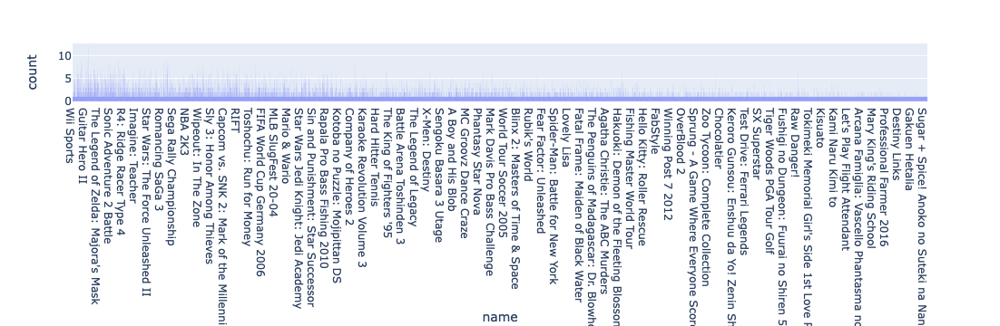

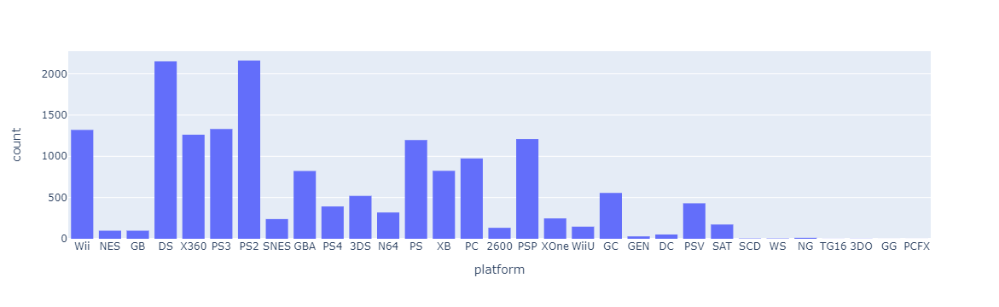

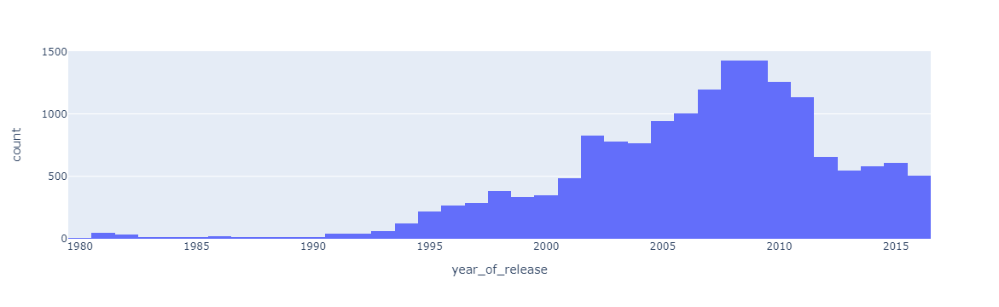

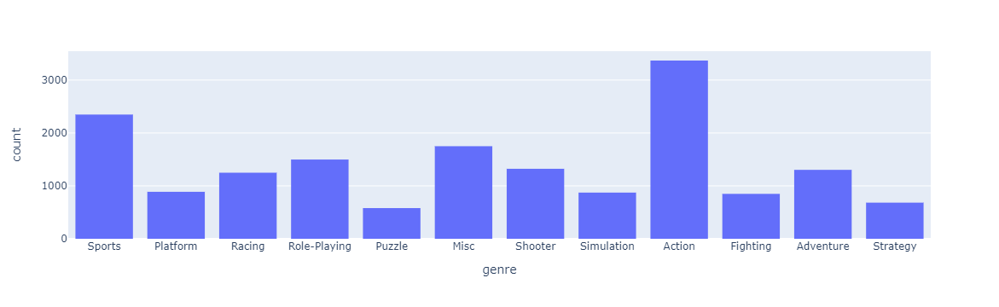

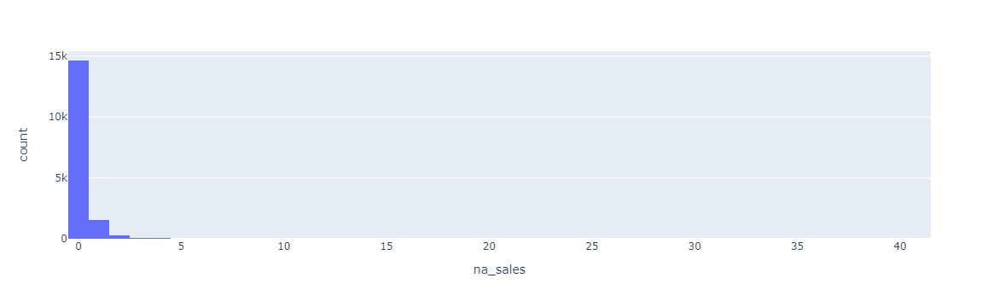

...

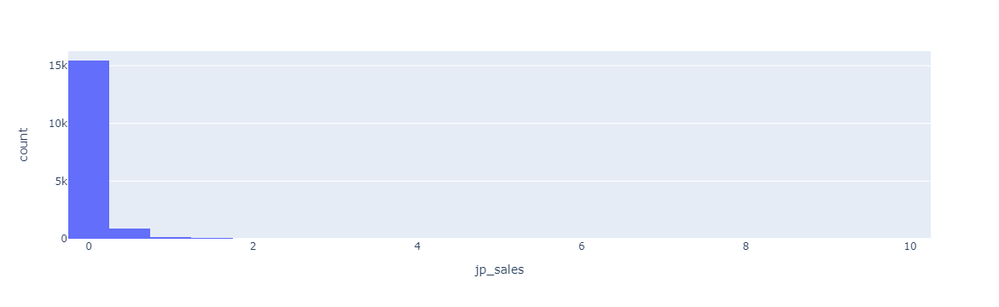

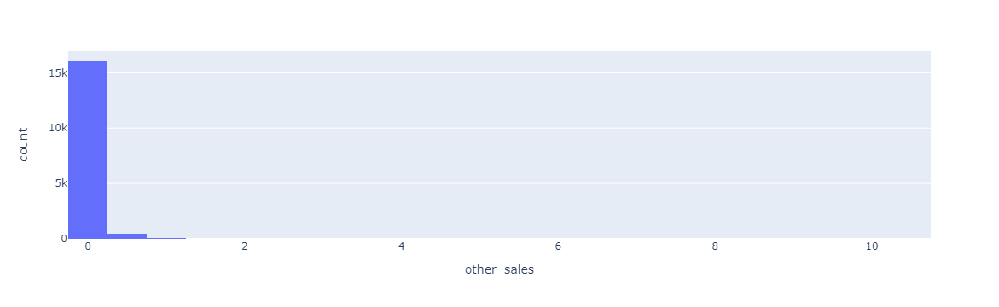

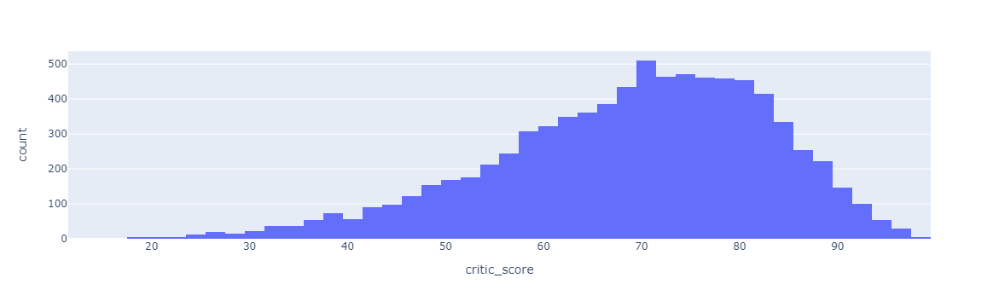

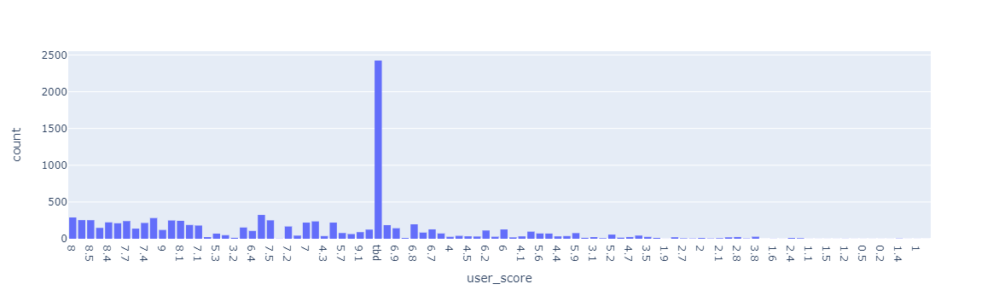

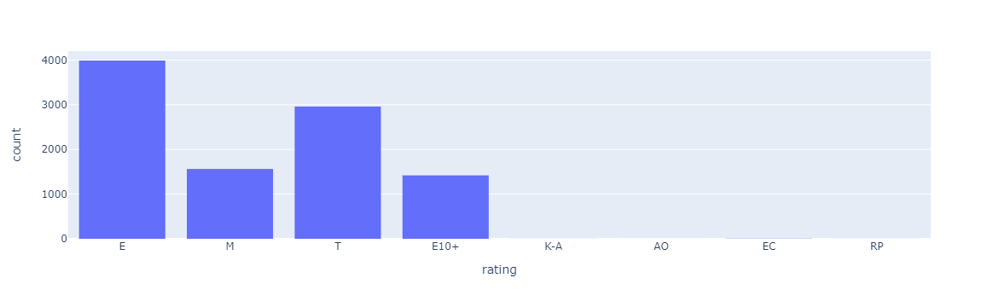

In [15]:
# для визуального представления построим гистограммы для всех столбцов датасета с помощью библиотеки Plotly
for column in data.columns:
    hist = px.histogram(data, x=column, nbins=50)
    hist.show()

**Выводы**

В каждой строке таблицы — данные о продажах игр, выпущенных на различных платформах в период с 1980 по 2016 года. В каждой строке имеются данные о продажах в разных регионах (Северная Америка, Европа, Япония и другие страны), данные о жанре, рейтинге ESRB, данные об оценке критиков и пользователей.

Предварительно можно утверждать, что данных достаточно для проведения исследовательского и статистического анализа и выявления закономерностей. Названия колонок были приведены к правильной стилистике. В наличии есть определенное количество пропусков, также в определенных столбцах необходимо поменять тип данных.

На первый взгляд, просмотрев гистограммы по основным данным, можем заметить, что в некоторых графиках имеется "ненормальное" распределение и возможно присутствуют выбросы. 

Для проведения анализа данных проведем предобработку данных

## **Предобработка данных**

### **Корректировка типов данных**

In [16]:
# посмотрим основную информацию по датасету
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16715 non-null  object 
 2   year_of_release  16446 non-null  float64
 3   genre            16713 non-null  object 
 4   na_sales         16715 non-null  float64
 5   eu_sales         16715 non-null  float64
 6   jp_sales         16715 non-null  float64
 7   other_sales      16715 non-null  float64
 8   critic_score     8137 non-null   float64
 9   user_score       10014 non-null  object 
 10  rating           9949 non-null   object 
dtypes: float64(6), object(5)
memory usage: 1.4+ MB


Поменяем тип данных в столбцах `year_of_release` и `critic_score`

В столбце `year_of_release` поменяем тип данных с `float64` на `int`, так как значения в данном столбце определяют год выхода игры. Также в столбце `user_score` поменяем тип данных на float64, который содержит данные по пользовательскому рейтингу в числовом выражении

In [17]:
#поменяем тип данных в через astype
data['year_of_release'] = data['year_of_release'].astype('Int64')
#преобразуем в число данные таблицы user_score
data['user_score'] = pd.to_numeric(data['user_score'], errors='coerce')
data['user_score'] = data['user_score'].astype(float)

In [18]:
#рассмотрим данные после изменения типа данных
data.head()

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
0,Wii Sports,Wii,2006,Sports,41.36,28.96,3.77,8.45,76.0,8.0,E
1,Super Mario Bros.,NES,1985,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008,Racing,15.68,12.76,3.79,3.29,82.0,8.3,E
3,Wii Sports Resort,Wii,2009,Sports,15.61,10.93,3.28,2.95,80.0,8.0,E
4,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN


In [19]:
# посмотрим основную информацию по датасету
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16715 non-null  object 
 2   year_of_release  16446 non-null  Int64  
 3   genre            16713 non-null  object 
 4   na_sales         16715 non-null  float64
 5   eu_sales         16715 non-null  float64
 6   jp_sales         16715 non-null  float64
 7   other_sales      16715 non-null  float64
 8   critic_score     8137 non-null   float64
 9   user_score       7590 non-null   float64
 10  rating           9949 non-null   object 
dtypes: Int64(1), float64(6), object(4)
memory usage: 1.4+ MB


### **Обработка пропусков**

Рассмотрим количество пропусков в каждом столбце и в первую очередь проработаем ожидаемые пропуски

In [20]:
#посчитаем количество ожидаемах пропусков в каждом столбце
data.isna().sum()

name                  2
platform              0
year_of_release     269
genre                 2
na_sales              0
eu_sales              0
jp_sales              0
other_sales           0
critic_score       8578
user_score         9125
rating             6766
dtype: int64

In [21]:
# пропущенные значения бары

def pass_value_barh(df):
    (
        (df.isna().mean()*100)
        .to_frame()
        .rename(columns = {0:'space'})
        .query('space > 0')
        .sort_values(by = 'space', ascending = True)
        .plot(kind= 'barh', figsize=(19,6), rot = -5, legend = False, fontsize = 16)
        .set_title('Пример' + "\n", fontsize = 22, color = 'SteelBlue')    
    );    

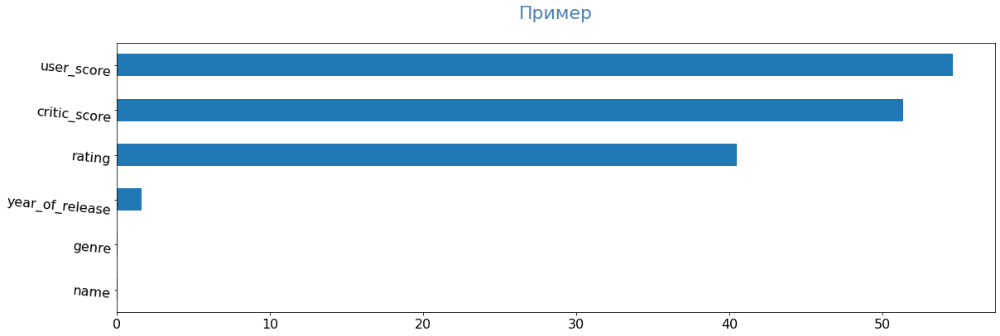

In [22]:
pass_value_barh(data)

В первую очередь разберемся со столбцами `name` и `genre`, что не займет много времени

In [23]:
#рассмотрим пустые значения в столбце 
data[data['name'].isna()].head()

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
659,NaN,GEN,1993,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
14244,NaN,GEN,1993,NaN,0.00,0.00,0.03,0.00,NaN,NaN,NaN


Данные строки можно удалить, так как не содержат основных данных по наименованию игры и жанру

In [24]:
#удалим строки с пустыми значениям в столбцах `name` и `genre`
data = data.dropna(subset=['name', 'genre'])

Далее рассмотрим строки где имеются пропуски в столбце `year_of_release`

In [25]:
data[data['year_of_release'].isna()].head(30)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
183,Madden NFL 2004,PS2,<NA>,Sports,4.26,0.26,0.01,0.71,94.0,8.5,E
377,FIFA Soccer 2004,PS2,<NA>,Sports,0.59,2.36,0.04,0.51,84.0,6.4,E
456,LEGO Batman: The Videogame,Wii,<NA>,Action,1.80,0.97,0.00,0.29,74.0,7.9,E10+
475,wwe Smackdown vs. Raw 2006,PS2,<NA>,Fighting,1.57,1.02,0.00,0.41,NaN,NaN,NaN
609,Space Invaders,2600,<NA>,Shooter,2.36,0.14,0.00,0.03,NaN,NaN,NaN
627,Rock Band,X360,<NA>,Misc,1.93,0.33,0.00,0.21,92.0,8.2,T
657,Frogger's Adventures: Temple of the Frog,GBA,<NA>,Adventure,2.15,0.18,0.00,0.07,73.0,NaN,E
678,LEGO Indiana Jones: The Original Adventures,Wii,<NA>,Action,1.51,0.61,0.00,0.21,78.0,6.6,E10+
719,Call of Duty 3,Wii,<NA>,Shooter,1.17,0.84,0.00,0.23,69.0,6.7,T
805,Rock Band,Wii,<NA>,Misc,1.33,0.56,0.00,0.20,80.0,6.3,T


Пропуски столбце `year_of_release` попробуем запонить частино, согласно названия игры. Есть определенная закономерность выпуска спортивных симуляторов за за пру месяцев до наступления года упомянутого в названии. К примеру FIFA 2016 вышла осенью 2015 года. Остальные пропуски заполнить не получиться, т.к. данные по году выпуска отсутствуют у игр, вышедших в разные годы в период с 1980 по 2016 года. 

Сгруппируем пропуски по платформам. Может есть закономерность появления пропусков в зависимости от платформы

In [26]:
data[data['year_of_release'].isna()].groupby('platform')['name'].count()

platform
2600    17
3DS      8
DS      30
GB       1
GBA     11
GC      14
N64      3
PC      17
PS       7
PS2     34
PS3     25
PSP     16
PSV      1
Wii     34
X360    30
XB      21
Name: name, dtype: int64

Закономерность отсутствует. Пропуски присутствуют на разных платформах.

Теперь заполним год выпуска в соответствие с названием игры

In [27]:
#создадим функцию определния года выпуска
def correct_year(name):
    #исключеним применение функции на пустых значениях столбца `name`
    if name is np.nan:
        return np.nan
    #разделим значения в строке на отдельные слова
    year = name.split(' ')[-1]
    try:
        #преобразуем года в целочисленные значения
        year = int(year)
    except:
    #возвращаем NaN если в строке нет года или число за пределами временнОго диапазона в базе данных 
        return np.nan
    if year<1980 or year>2017:
        return np.nan  
    #возвращаем целочисленное значение year
    return year-1

data.year_of_release = data.year_of_release.fillna(data['name'].apply(correct_year))

При заполнении пропусков в столбце 'year_of_release' синтетическими данными проверим уникальные значения для исключения возникновения аномальных значений

In [28]:
data['year_of_release'].unique()

<IntegerArray>
[2006, 1985, 2008, 2009, 1996, 1989, 1984, 2005, 1999, 2007, 2010, 2013, 2004,
 1990, 1988, 2002, 2001, 2011, 1998, 2015, 2012, 2014, 1992, 1997, 1993, 1994,
 1982, 2016, 2003, 1986, 2000, 1995, 1991, 1981, 1987, 1980, 1983, <NA>]
Length: 38, dtype: Int64

Данные заполнились корректно, аномальные значения отсутствуют

In [29]:
#посчитаем количество ожидаемах пропусков в каждом столбце
data.isna().sum()

name                  0
platform              0
year_of_release     254
genre                 0
na_sales              0
eu_sales              0
jp_sales              0
other_sales           0
critic_score       8576
user_score         9123
rating             6764
dtype: int64

Количество пропусков сократилось незначительно, но и игр с годами в названии выходит не так много

Теперь обработаем пропуски в столбце `user_score`. Но сначала переименуем все значения `tbd` на `NaN`. 

Абревиатура `tbd` означет что рейтинг игре еще не определен. Рейтинг присваивается только после выполнения определенных условий, в том числе по количеству выставленных оценок

In [30]:
# заменим значения `tbd` значением `NaN`
data.loc[data.user_score == 'tbd', 'user_score'] = np.nan

In [31]:
#посчитаем количество ожидаемах пропусков в каждом столбце
data.isna().sum()

name                  0
platform              0
year_of_release     254
genre                 0
na_sales              0
eu_sales              0
jp_sales              0
other_sales           0
critic_score       8576
user_score         9123
rating             6764
dtype: int64

Далее сравняем значения пропуски в столбце `user_score` значениям в столбце `critic_score`, т.к. значения пользовательского рейтинга редко сильно отличаются от рейтинга критиков.

In [32]:
# заполним пропуски в столбце 'user_score' в соответствие со столбцом 'critic_score'/10
data['user_score'] = data['user_score'].fillna((data['critic_score']/10))

In [33]:
# заполним пропуски в столбце 'critic_score' в соответствие со столбцом 'user_score'*10
data['critic_score'] = data['critic_score'].fillna(data['user_score']*10)

In [34]:
#посчитаем количество ожидаемах пропусков в каждом столбце
data.isna().sum()

name                  0
platform              0
year_of_release     254
genre                 0
na_sales              0
eu_sales              0
jp_sales              0
other_sales           0
critic_score       8003
user_score         8003
rating             6764
dtype: int64

Заполнить остальные пропуски в столбцах `critic_score` и `user_score` средними или медианными значениями в зависимости от платформы или жанра будет некорректно, и может повлиять на итоговые выводы при формировании стратегии рекламной кампании. Рейтинг игр не зависит ни от жанра, платформы или года выхода, а зависит только от качества самого продукта.

In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16713 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16713 non-null  object 
 2   year_of_release  16459 non-null  Int64  
 3   genre            16713 non-null  object 
 4   na_sales         16713 non-null  float64
 5   eu_sales         16713 non-null  float64
 6   jp_sales         16713 non-null  float64
 7   other_sales      16713 non-null  float64
 8   critic_score     8710 non-null   float64
 9   user_score       8710 non-null   float64
 10  rating           9949 non-null   object 
dtypes: Int64(1), float64(6), object(4)
memory usage: 1.5+ MB


Рассмотрим пропуски в столбце `rating` сгруппировав по дате выхода. Возможно рейтинг отсутствует на старых играх

In [36]:
data[data['rating'].isna()].groupby('year_of_release')['name'].count()

year_of_release
1980      9
1981     46
1982     36
1983     17
1984     14
1985     13
1986     21
1987     16
1988     14
1989     17
1990     16
1991     41
1992     41
1993     60
1994    120
1995    219
1996    256
1997    270
1998    347
1999    296
2000    202
2001    143
2002    174
2003    162
2004    164
2005    235
2006    329
2007    377
2008    446
2009    415
2010    457
2011    433
2012    298
2013    228
2014    236
2015    291
2016    222
Name: name, dtype: int64

Это не подтвердилось, но попробуем сгруппировать по платформам. Может для некоторых платформ рейтинг ESRB не выдается. Также видим отсутствие аномальных значений в столбце `year_of_release`

In [37]:
data[data['rating'].isna()].groupby('platform')['name'].count()

platform
2600    133
3DO       3
3DS     292
DC       38
DS      878
GB       98
GBA     300
GC       87
GEN      27
GG        1
N64     319
NES      98
NG       12
PC      200
PCFX      1
PS      989
PS2     680
PS3     379
PS4     137
PSP     665
PSV     279
SAT     173
SCD       6
SNES    239
TG16      2
WS        6
Wii     318
WiiU     42
X360    210
XB       91
XOne     61
Name: name, dtype: int64

Также не подтвердилось, пропуски есть в строках с разными платформами. 

Отметит отсутствие неявных дубликатов в столбце `platform`

Попробуем сгруппировать по жанрам. Для некоторых жанров можно предположить рейтинг ESRB. К примеру для спортивных игр рейтинг скорее всего 'E'

In [38]:
data[data['rating'].isna()].groupby('genre')['name'].count()

genre
Action          1181
Adventure        857
Fighting         411
Misc             868
Platform         319
Puzzle           238
Racing           377
Role-Playing     721
Shooter          304
Simulation       305
Sports           839
Strategy         344
Name: name, dtype: int64

Думаю можно сказать определенно, что в подавляющем большинстве случаев в жанрах `Platform`, `Puzzle`, `Sports` присваивается рейтинг `E`, а в жанрах `Racing`, `Simulation` рейтинг скорее всего `E10+`. В остальных жанрах рейтинг может быть вплоть до `AO`. Соответсвенно заполним пропуски в соотвествие со сделанным выводом. 

Также видим отсутствие неявных дубликатов в столбце `genre`

Остальные пропуски в столбце 'rating' заполним пустой строкой

In [39]:
# создадим списки жанров, согласно которых заполним пропуски в столбце `rating`
row1 = ['Platform', 'Puzzle', 'Sports']
row2 = ['Racing', 'Simulation']
# через цикл заполним пропуски в столбце `rating` с помощью try-except
for genre in row1:
    try:
        data.loc[(data['genre'] == genre) & (data['rating'].isna()), 'rating'] = 'E'
    except:
        print('не получилось присвоить рейтинг')
        
for genre in row2:
    try:
        data.loc[(data['genre'] == genre) & (data['rating'].isna()), 'rating'] = 'E10+'
    except:
        print('не получилось присвоить рейтинг')

In [40]:
data['rating'] = data['rating'].fillna('')

In [41]:
#посчитаем количество ожидаемах пропусков в каждом столбце
data.isna().sum()

name                  0
platform              0
year_of_release     254
genre                 0
na_sales              0
eu_sales              0
jp_sales              0
other_sales           0
critic_score       8003
user_score         8003
rating                0
dtype: int64

Предполагаем, что возможными причинами возникновения пропусков в данном случае могут быть:
- ошибки в выгрузке или формировании датасета;
- отсутствие рейтинга ESRB может быть связано с тем, что не все игры могут продаваться в Северной Америке и также не всем играм он мог выдаваться в виду разных причин, к примеру, из-за нежелания издателя или разработчика присылать заявку на присвоение рейтинга;
- отсутствие данных рейтинга критиков или пользователей, возможно связано с недостаточным количеством выставленных оценок или рецензий, ведь не все игры становятся популярными.

### **Обработка дубликатов**

Обработаем явные дубликаты в датасете

In [42]:
# выведем количество дубликатов в датасете
display(data.duplicated().sum())

0

Явных дубликатов в датасете нет. Проверим наличие неявных дубликатов в столбце `rating`

In [43]:
#рассмотрим уникальные значения столбца `rating`
data['rating'].unique()

array(['E', '', 'E10+', 'M', 'T', 'K-A', 'AO', 'EC', 'RP'], dtype=object)

### **Обработка аномальных значений**

Проверим наличие аномальных значений в следующих столбцах, касающихся характеристик продаж и рейтинга игр в столбцах `na_sales`, `eu_sales`, `jp_sales`, `other_sales`, `critic_score`, `user_score`

In [44]:
# проверим количетсво, минимальное и максимальные значения в выбранных столбцах
(
    data[['na_sales', 'eu_sales', 'jp_sales', 'other_sales', 'critic_score', 'user_score']]
    .apply (['count', 'min', 'max'])   
    .style.format("{:,.2f}")
)

,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score
count,"16,713.00","16,713.00","16,713.00","16,713.00","8,710.00","8,710.00"
min,0.00,0.00,0.00,0.00,0.00,0.00
max,41.36,28.96,10.22,10.57,98.00,9.70


Аномальные значения по столбцам отсутствуют

**Выводы:** 

После предобработки данных количество пропусков сократилось, но в столбцах `critic_score`, `user_score` их осталось еще определенное количество (по 8003 пропуска), но при этом имеющихся данных должно хватить для выполнения анализа. Пропуски в столбце `rating` также частично заполнили значениями возрастных рейтингов в соответствии с жанрами.

Явные дубликаты и аномальные значения в датасете отсутствют. У части данных изменили тип данных для более правильного производства расчетов и анализа данных. 

## **Добавление и расчет данных для анализа**

Для проведения анализа данных необходимо добавить столбцы для проведения дальнейших расчетов и построения графиков.

Для начала добавим столбец с общим количеством продаж в каждом регионе по каждой позиции.

In [45]:
# посмотрим основную информацию по датасету после предобработки данных
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16713 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16713 non-null  object 
 2   year_of_release  16459 non-null  Int64  
 3   genre            16713 non-null  object 
 4   na_sales         16713 non-null  float64
 5   eu_sales         16713 non-null  float64
 6   jp_sales         16713 non-null  float64
 7   other_sales      16713 non-null  float64
 8   critic_score     8710 non-null   float64
 9   user_score       8710 non-null   float64
 10  rating           16713 non-null  object 
dtypes: Int64(1), float64(6), object(4)
memory usage: 1.5+ MB


In [46]:
# добавим столбец total_sales просуммировав значения столбцов na_sales, eu_sales, jp_sales, other_sales
data['total_sales'] = data[['na_sales','eu_sales','jp_sales', 'other_sales']].sum(axis = 1)
# проверим добавление столбца
data.head(20)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
0,Wii Sports,Wii,2006,Sports,41.36,28.96,3.77,8.45,76.0,8.0,E,82.54
1,Super Mario Bros.,NES,1985,Platform,29.08,3.58,6.81,0.77,NaN,NaN,E,40.24
2,Mario Kart Wii,Wii,2008,Racing,15.68,12.76,3.79,3.29,82.0,8.3,E,35.52
3,Wii Sports Resort,Wii,2009,Sports,15.61,10.93,3.28,2.95,80.0,8.0,E,32.77
4,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,,31.38
5,Tetris,GB,1989,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,E,30.26
6,New Super Mario Bros.,DS,2006,Platform,11.28,9.14,6.50,2.88,89.0,8.5,E,29.80
7,Wii Play,Wii,2006,Misc,13.96,9.18,2.93,2.84,58.0,6.6,E,28.91
8,New Super Mario Bros. Wii,Wii,2009,Platform,14.44,6.94,4.70,2.24,87.0,8.4,E,28.32
9,Duck Hunt,NES,1984,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,,28.31


## **Исследовательский анализ данных**

### **Продажи игр по годам**

Рассмотрим период продаж с 1980 года по 2016 год. Рассмотрим количество выпускаемых игр и продажи по годам

Будем применять гистограммы и диаграммы размаха

In [47]:
# поменяем пустые данные в столбце 'year_of_release', так как json не работает со значениями NaN
data['year_of_release'] = data['year_of_release'].fillna(np.nan).replace([np.nan], [None])

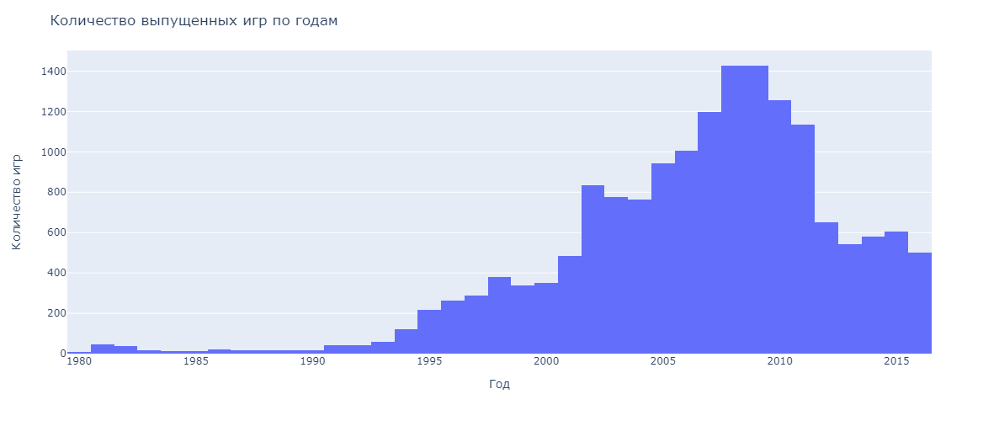

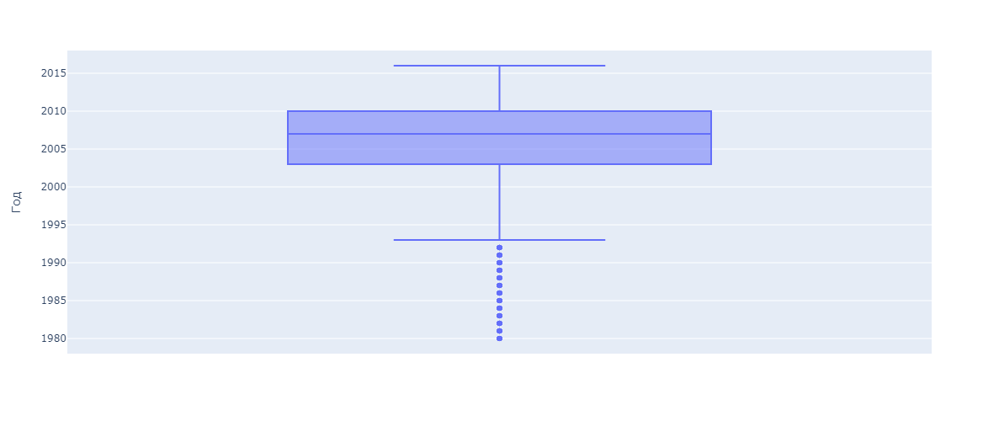

In [48]:
# построим гистограмму 
hist = px.histogram(data, x='year_of_release', nbins=50)
hist.update_layout({'title':'Количество выпущенных игр по годам'}, height=500)
# зададим название оси X
hist.update_xaxes({'title':'Год'})
# зададим название оси Y    
hist.update_yaxes({'title':'Количество игр'})
hist.show()
# построим диаграмму размаха
fig = px.box(data, y='year_of_release')
# зададим название оси Y    
fig.update_yaxes({'title':'Год'})
fig.update_layout(height=500)
fig.show()

In [49]:
# посчитаем количество игр выпущенных до 1994 года
data[data['year_of_release'] < 1994]['name'].count().sum()

365

Видим, что по столбцу `year_of_release` ненормальное распределение. Большинство игр было продано в период с 1994 по 2016 года. Наибольше количество игр выпущено в 2008 и в 2009 годах (1427 и 1426 соответственно). После 2009 года произошел спад по количеству выпускаемых игр. Скорее всего связано с мировым кризисом 2008 года.

Рассмотрим уровень продаж по годам

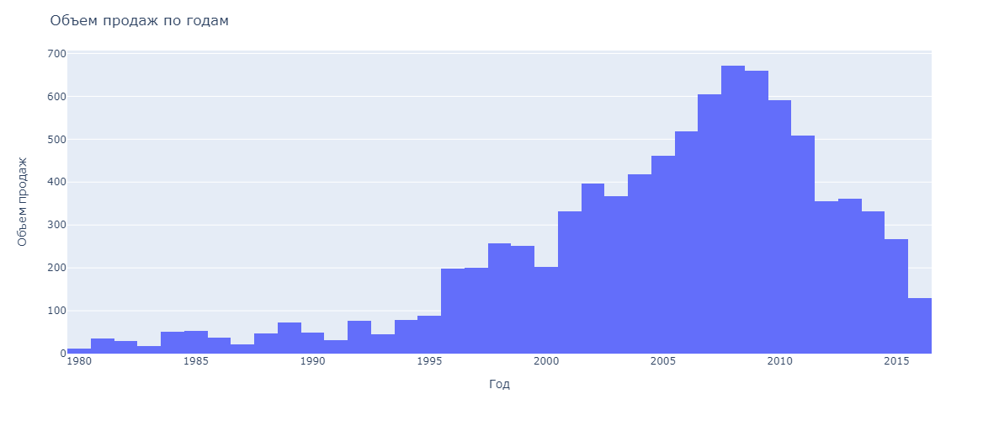

In [50]:
# построим гистограмму 
hist = px.histogram(data, x='year_of_release', y='total_sales')
hist.update_layout({'title':'Объем продаж по годам'}, height=500)
# зададим название оси X
hist.update_xaxes({'title':'Год'})
# зададим название оси Y    
hist.update_yaxes({'title':'Объем продаж'})
hist.show()

In [51]:
# посчитаем продажи игр выпущенных до 1994 года
data[data['year_of_release'] < 1994]['total_sales'].sum()

580.23

In [52]:
# посчитаем общие продажи игр
data['total_sales'].sum()

8913.29

Продажи визуально соотносятся количеству выпускаемых игр. Наибольшие продажи приходястя на 2008 и 2009 года (671 и 659 млн проданных игр). Также после 2009 года наблюдается спад в продажах, на что повлиял мировой кризис 2008 года

Для дальнейшего исследования возьмем период с 1994 года по 2016 год, т.к. за этот период выпущено `98%` и продано `93%` основное количество игр.

In [53]:
# оставим в датасете только данные с 1994 года
data = data.loc[(data['year_of_release']>1993) | (data['year_of_release'].isna())]

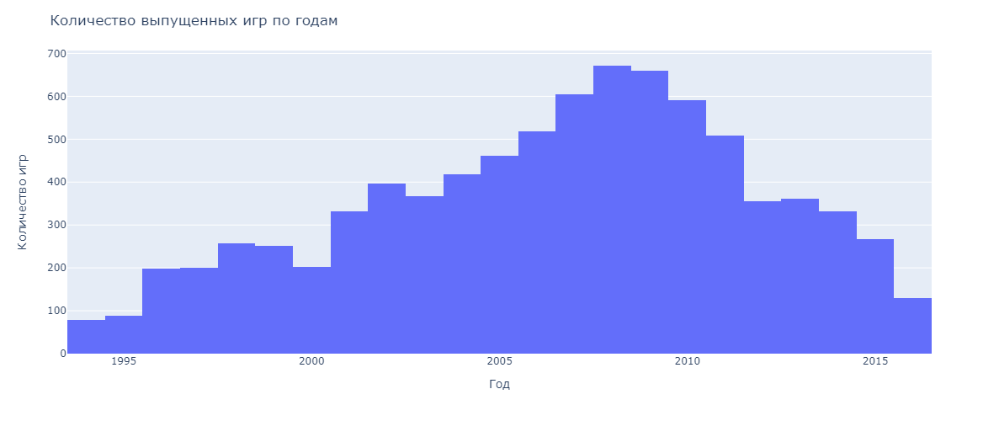

In [54]:
# построим гистограмму 
hist = px.histogram(data, x='year_of_release', y='total_sales')
hist.update_layout({'title':'Количество выпущенных игр по годам'}, height=500)
# зададим название оси X
hist.update_xaxes({'title':'Год'})
# зададим название оси Y    
hist.update_yaxes({'title':'Количество игр'})
hist.show()

### **Продажи игр по платформам**

Посмотрим, как менялись продажи по платформам. Выберим платформы с наибольшими суммарными продажами и построим распределение по годам. Ответим за какой характерный срок появляются новые и исчезают старые платформ

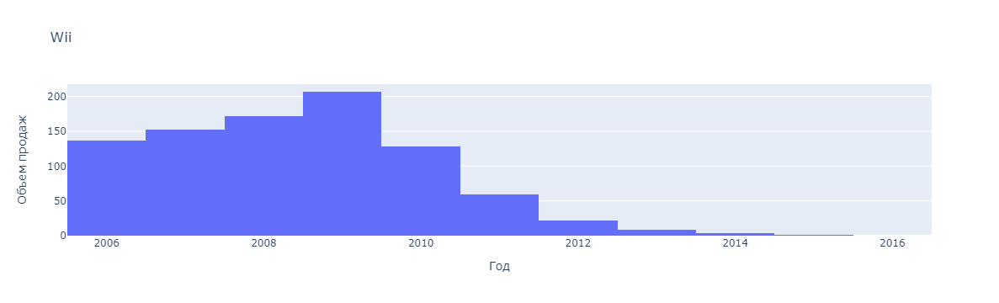

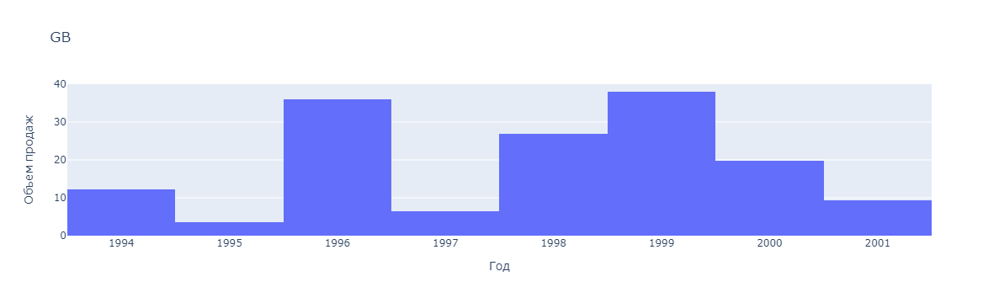

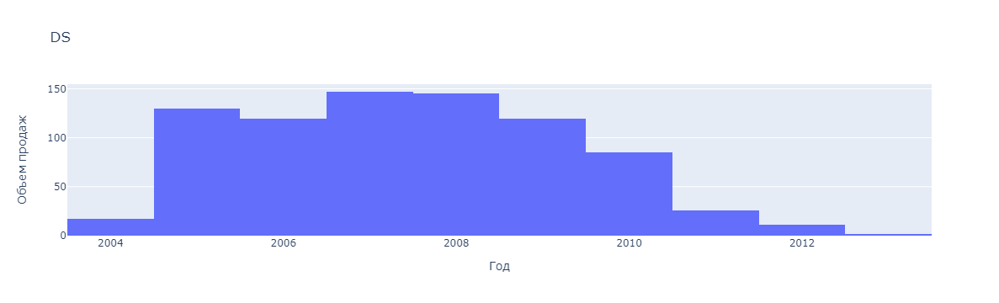

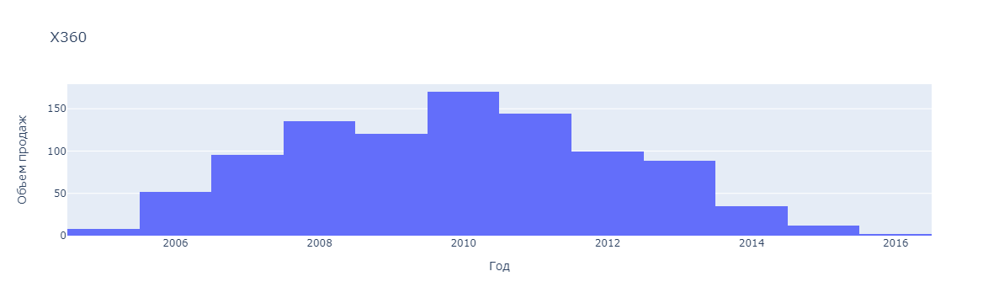

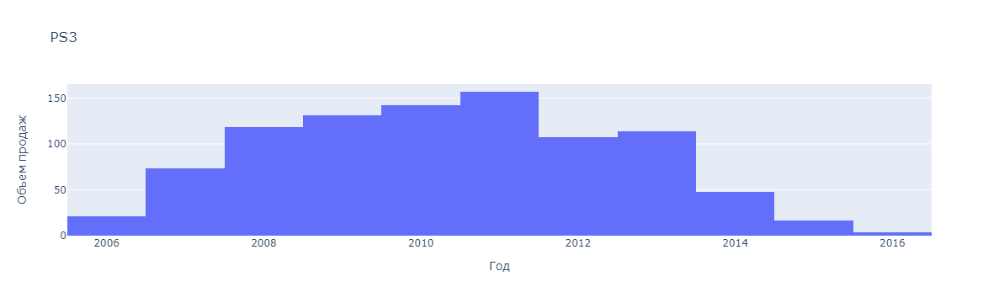

...

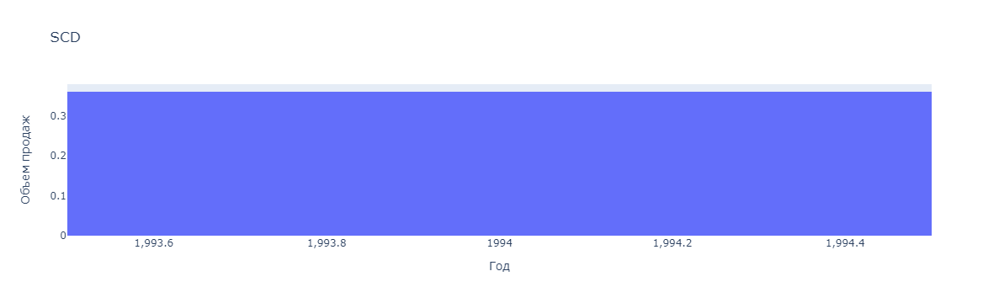

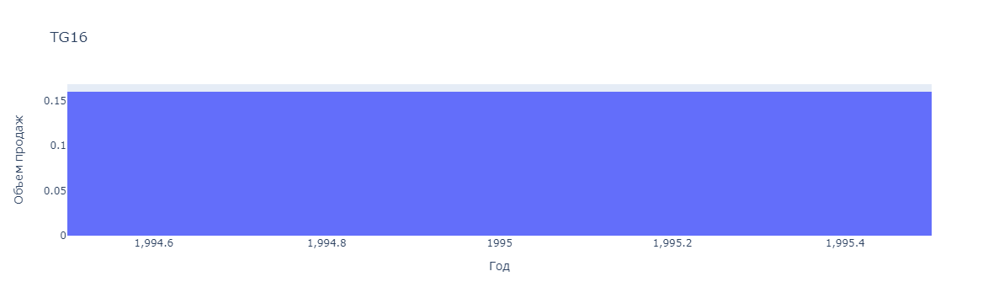

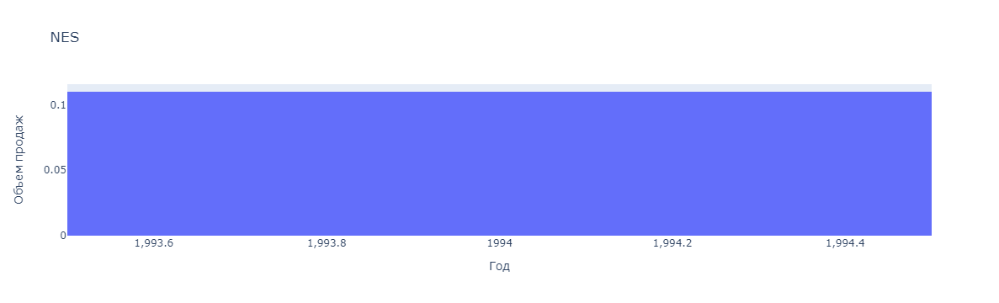

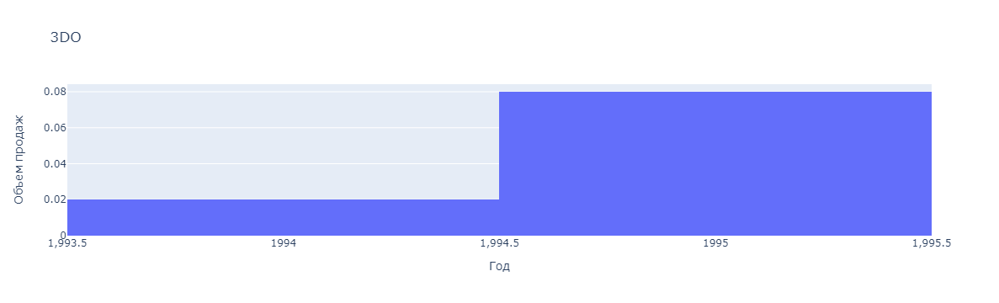

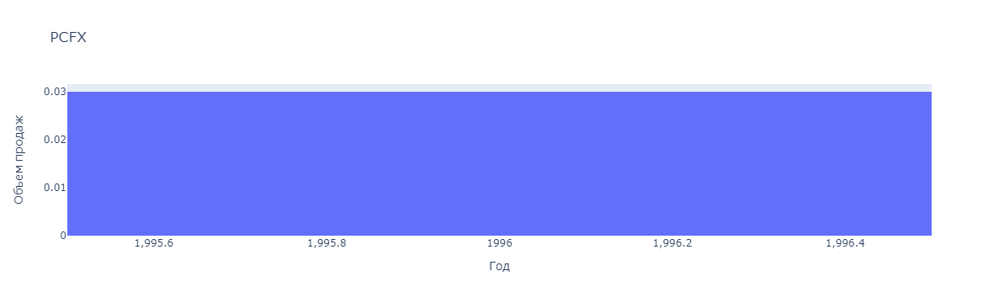

In [55]:
# создадим список платформ
platform = data['platform'].unique()

# построим графики продаж игр по платформам
for row in platform:
    fig1 = go.Figure()
    fig1.add_trace(go.Histogram(dict(x=data[data['platform'] == row]["year_of_release"], 
                                     y=data[data['platform'] == row]['total_sales'], 
                                     histfunc = 'sum', name=row)))
    fig1.update_layout({'title': row})
    # зададим название оси X
    fig1.update_xaxes({'title':'Год'})
    # зададим название оси Y    
    fig1.update_yaxes({'title':'Объем продаж'})
    fig1.show()

Из графиков видно, что у всех платформ разные сроки жизнедеятельности на рынке. Непопулярные платформы закрываются практически сразу в течении 1-2 лет. Более популярные платформы существуют на рынке от 6 до 10 лет. Многое, конечно, зависит от количесва выпускаемых игр и объема продаж, но в среднем через 3-5 лет объем продаж снижается. Это порой в том числе связывают с анонсами новых поколений платформ.

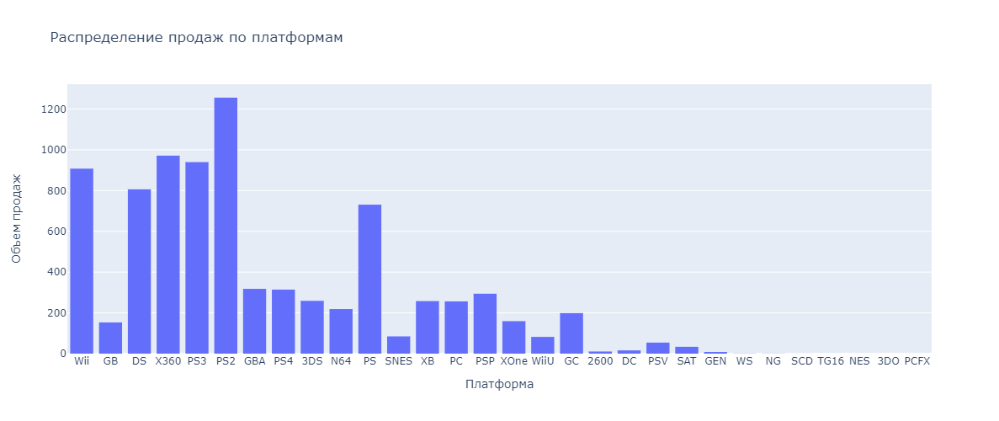

In [56]:
#Рассмотрим платформы с наибольшими объемами продаж 
fig2 = go.Figure()
fig2.add_trace(go.Histogram(histfunc="sum", x=data['platform'], y=data['total_sales'], nbinsx=100))
fig2.update_layout({'title': 'Распределение продаж по платформам'}, height=500)
# зададим название оси X
fig2.update_xaxes({'title':'Платформа'})
# зададим название оси Y    
fig2.update_yaxes({'title':'Объем продаж'})
fig2.show()

In [57]:
data['total_sales'].sum()

8333.06

Наиболее популярными платформами по объему продаж игр за период с 1994 по 2016 года являются: Sony PS2 (1 255 млн.), XBOX360 (971 млн.), Sony PS3 (939 млн.), Nintendo Wii (907 млн.), Nintendo DS (806 млн.), Sony PS (730 млн.). На перечисленные платформы пришлось 67% продаж за рассматриваемы период

In [58]:
# выберим платформы с объемом продаж больше 250 млн за период c 1994 по 2016
data_grouped_by_sales = data.pivot_table(index=['platform'], aggfunc={'total_sales': ['sum']})
data_grouped_by_sales.reset_index(inplace=True)
data_grouped_by_sales.columns = ['name', 'total_sales']
data_grouped_by_sales.sort_values('total_sales', ascending=False)

,name,total_sales
15,PS2,1255.77
27,X360,971.42
16,PS3,939.65
25,Wii,907.51
4,DS,806.10
14,PS,730.86
6,GBA,317.85
17,PS4,314.14
18,PSP,294.05
2,3DS,259.00


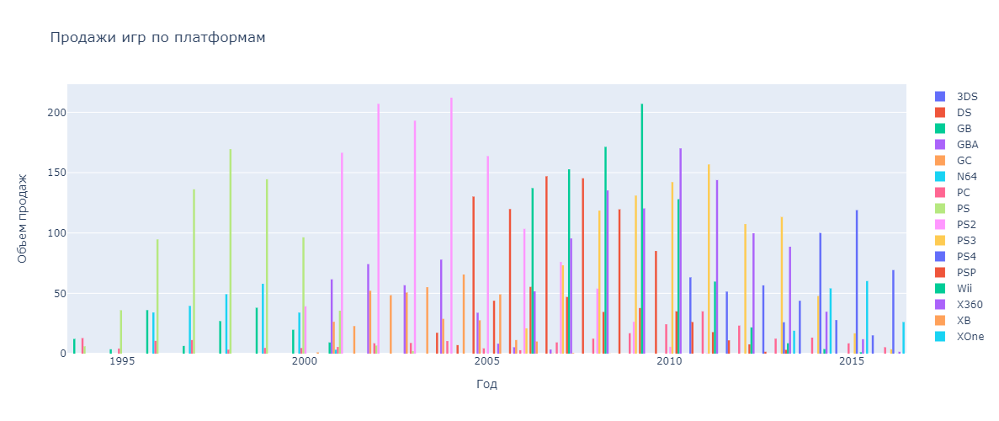

In [59]:
# выделим отдельно список платформ с объемами продаж больше 150 млн
platform = data_grouped_by_sales.loc[(data_grouped_by_sales['total_sales']>150),'name']

# построим график продаж игр по выбранным платформам
fig3 = go.Figure()
for row in platform:
    fig3.add_trace(go.Histogram(dict(x=data[data['platform'] == row]["year_of_release"],
                                     y=data[data['platform'] == row]['total_sales'],
                                     histfunc='sum', name=row)))
fig3.update_layout(bargap=0.1)
# зададим название оси X
fig3.update_xaxes({'title':'Год'})
# зададим название оси Y    
fig3.update_yaxes({'title':'Объем продаж'})
fig3.update_layout({'title': 'Продажи игр по платформам'}, height=500)
fig3.show()

Для проработки стратегии рекламной кампании в 2017 году возьмем период за последние 5 лет, который отражает основные тенденции развития игровых платформ

In [60]:
#сделаем срез данных за последние 5 лет
data_last_years = data[data['year_of_release'] > 2011]

In [61]:
data_last_years.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2886 entries, 16 to 16714
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             2886 non-null   object 
 1   platform         2886 non-null   object 
 2   year_of_release  2886 non-null   object 
 3   genre            2886 non-null   object 
 4   na_sales         2886 non-null   float64
 5   eu_sales         2886 non-null   float64
 6   jp_sales         2886 non-null   float64
 7   other_sales      2886 non-null   float64
 8   critic_score     1546 non-null   float64
 9   user_score       1546 non-null   float64
 10  rating           2886 non-null   object 
 11  total_sales      2886 non-null   float64
dtypes: float64(7), object(5)
memory usage: 293.1+ KB


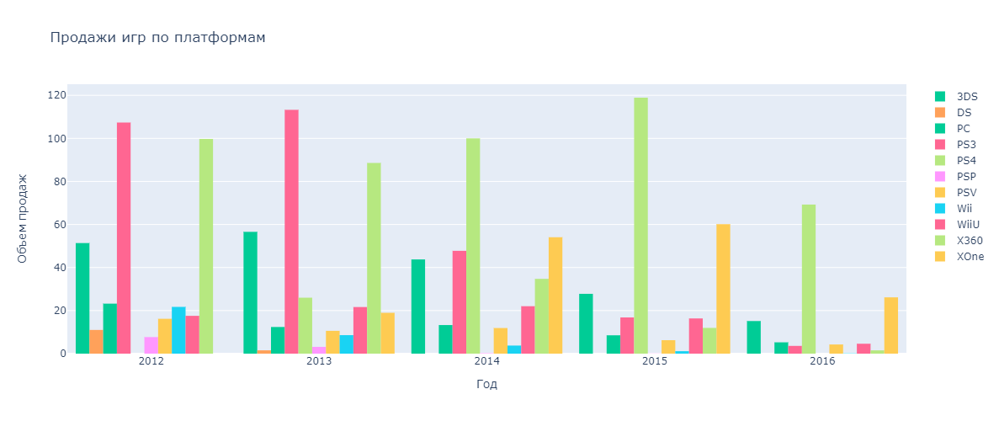

In [62]:
# выделим отдельно список платформ с объемами продаж больше 150 млн
platform = data_grouped_by_sales['name']

# построим график продаж игр по выбранным платформам
fig4 = go.Figure()
for row in platform:
    fig4.add_trace(go.Histogram(dict(x=data_last_years[data_last_years['platform'] == row]["year_of_release"],
                                     y=data_last_years[data_last_years['platform'] == row]['total_sales'],
                                     histfunc='sum', name=row)))
fig4.update_layout(bargap=0.1)
# зададим название оси X
fig4.update_xaxes({'title':'Год'})
# зададим название оси Y    
fig4.update_yaxes({'title':'Объем продаж'})
fig4.update_layout({'title': 'Продажи игр по платформам'}, height=500)
fig4.show()

За последние 5 лет можно отметить следующее:
- наиболее популярными платформами являются Sony PS3, Sony PS4, XBOX360, XBOX One, Nintendo 3DS.
- стоит отметить стабильное снижение затрат на платформах, предыдущего поколения: Sony PS3, XBOX360, Nintendo 3DS, Nintendo Wii, Sony PSP
- постепенный рост продаж отмечается у Sony PS4, XBOX One
- отметим провальные продажи относительно новой платформы платформы Nintendo Wii
- рынок PC  в последние годы снижался, но он всегда отличался своей нестабильностью

Далее построим диаграммы размаха по каждой платформе за последние 5 лет

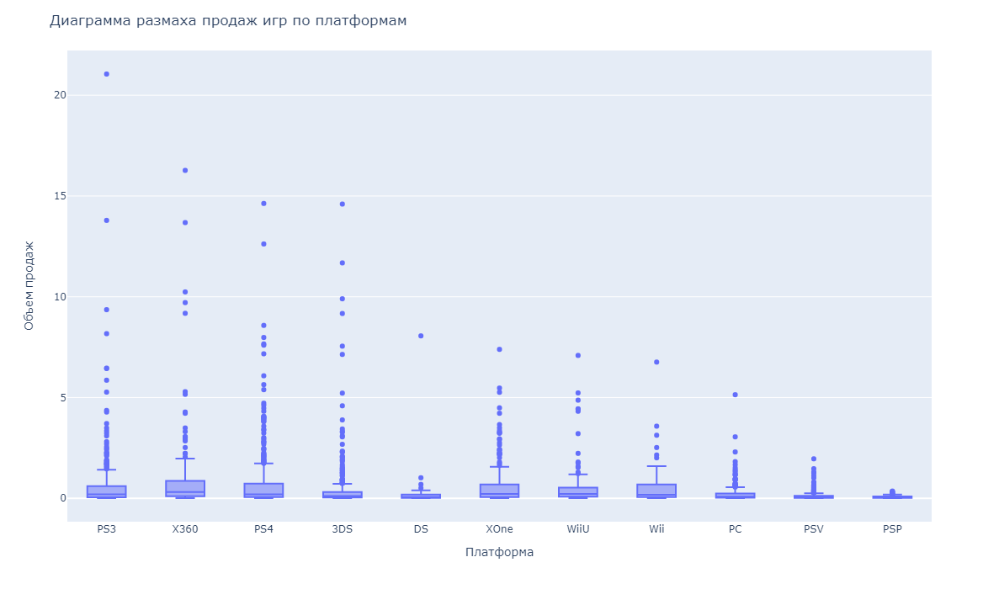

In [63]:
# построим график продаж игр по выбранным платформам
fig5 = px.box(data_last_years, x='platform', y='total_sales')
fig5.update_layout(bargap=0.1)
# зададим название оси X
fig5.update_xaxes({'title':'Платформа'})
# зададим название оси Y    
fig5.update_yaxes({'title':'Объем продаж'})
fig5.update_layout({'title': 'Диаграмма размаха продаж игр по платформам'}, height=700)
fig5.show()

По диаграмме размаха можем наблюдать следующее:
- большинство игр на разных платформах редко достигают продаж более 600-900 тыс. проданных копий
- популярными играми можно считать игры с общими продажами от 1,5 млн. проданных копий. На каждой платформе количество таких игр составляет менее 1%. Но порой продажи хитов достигают 21 млн. (PS3), или 16 млн. (XBOX360)
- медианное значение объема продаж на популярных платформах составляет 200-300 проданных копий игр. Наиболее привлекательной с это стороны из новых платформ можно рассматривать XBOX One с медианным объемом продаж в 220 тыс.

### **Влияние отзывов на продажи на популярных платформах**

Посмотрим, как влияют на продажи внутри одной популярной платформы отзывы пользователей и критиков с помощью диаграмм рассеяния и посчитаем корреляцию между отзывами и продажами

In [64]:
# выясним самую популярную платформу за последние 5 лет
data_grouped_by_sales = data_last_years.pivot_table(index=['platform'], aggfunc={'total_sales': ['sum']})
data_grouped_by_sales.reset_index(inplace=True)
data_grouped_by_sales.columns = ['name', 'total_sales']
data_grouped_by_sales.sort_values('total_sales', ascending=False)

,name,total_sales
4,PS4,314.14
3,PS3,288.79
9,X360,236.54
0,3DS,194.61
10,XOne,159.32
8,WiiU,82.19
2,PC,62.65
6,PSV,49.18
7,Wii,35.37
1,DS,12.55


Рассмотрим данные по Sony PS4

In [65]:
# выделим отдельно датасет по Sony PS4 за последние 5 лет
data_last_years_ps4 = data_last_years[data_last_years['platform'] == 'PS4']

In [66]:
data_last_years_ps4.head(10)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
31,Call of Duty: Black Ops 3,PS4,2015,Shooter,6.03,5.86,0.36,2.38,NaN,NaN,,14.63
42,Grand Theft Auto V,PS4,2014,Action,3.96,6.31,0.38,1.97,97.0,8.3,M,12.62
77,FIFA 16,PS4,2015,Sports,1.12,6.12,0.06,1.28,82.0,4.3,E,8.58
87,Star Wars Battlefront (2015),PS4,2015,Shooter,2.99,3.49,0.22,1.28,NaN,NaN,,7.98
92,Call of Duty: Advanced Warfare,PS4,2014,Shooter,2.81,3.48,0.14,1.23,83.0,5.7,M,7.66
94,FIFA 17,PS4,2016,Sports,0.66,5.75,0.08,1.11,85.0,5.0,E,7.60
105,Fallout 4,PS4,2015,Role-Playing,2.53,3.27,0.24,1.13,87.0,6.5,M,7.17
143,FIFA 15,PS4,2014,Sports,0.80,4.33,0.05,0.90,82.0,5.7,E,6.08
154,Destiny,PS4,2014,Shooter,2.49,2.07,0.16,0.92,76.0,6.1,T,5.64
171,Uncharted 4: A Thief's End,PS4,2016,Shooter,1.85,2.50,0.19,0.85,93.0,7.9,T,5.39


In [67]:
data_last_years_ps4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 392 entries, 31 to 16585
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             392 non-null    object 
 1   platform         392 non-null    object 
 2   year_of_release  392 non-null    object 
 3   genre            392 non-null    object 
 4   na_sales         392 non-null    float64
 5   eu_sales         392 non-null    float64
 6   jp_sales         392 non-null    float64
 7   other_sales      392 non-null    float64
 8   critic_score     260 non-null    float64
 9   user_score       260 non-null    float64
 10  rating           392 non-null    object 
 11  total_sales      392 non-null    float64
dtypes: float64(7), object(5)
memory usage: 39.8+ KB


In [68]:
# создадим функцию для построения графика
def sct (column, title, axisx):
    try:
        # Построим диаграмму рассеивания с помощью px.scatter с прозрачностью каждой точки в 0.3, высотой 500 пикселей
        figsc = go.Figure()
        figsc = px.scatter(data_last_years_ps4, x=column, y='total_sales', opacity=0.3)
        # зададим высоту графика и его название
        figsc.update_layout({'title':title}, height=500)
        # зададим название оси X
        figsc.update_xaxes({'title':axisx})
        # зададим название оси Y    
        figsc.update_yaxes({'title':'Объем продаж'})
        # зададим параметры маркеров
        figsc.update_traces(marker=dict(size=6,
                                        line=dict(width=0.2,
                                                  color='DarkSlateGrey')),
                            selector=dict(mode='markers'))
        figsc.show()
    except:
        display('проверь параметры')

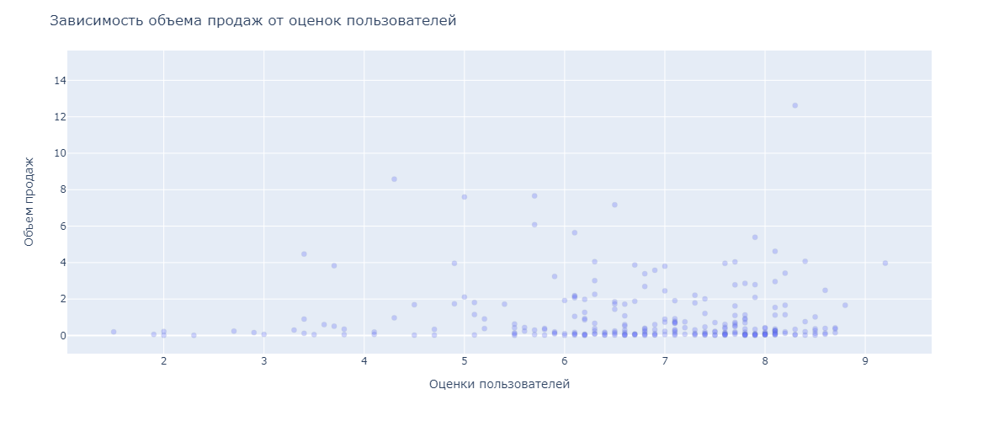

In [69]:
# применим функцию sct к 'user_score'
sct('user_score', 'Зависимость объема продаж от оценок пользователей', 'Оценки пользователей')

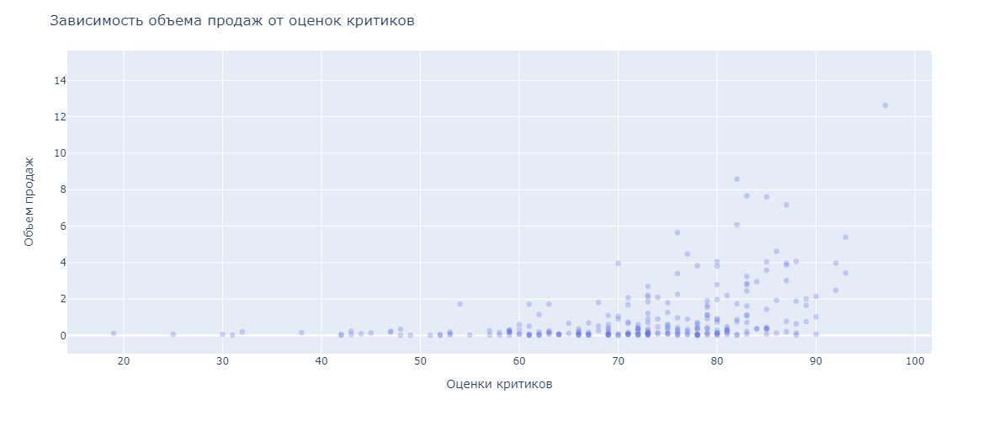

In [70]:
# применим функцию sct к 'user_score'
sct('critic_score', 'Зависимость объема продаж от оценок критиков', 'Оценки критиков')

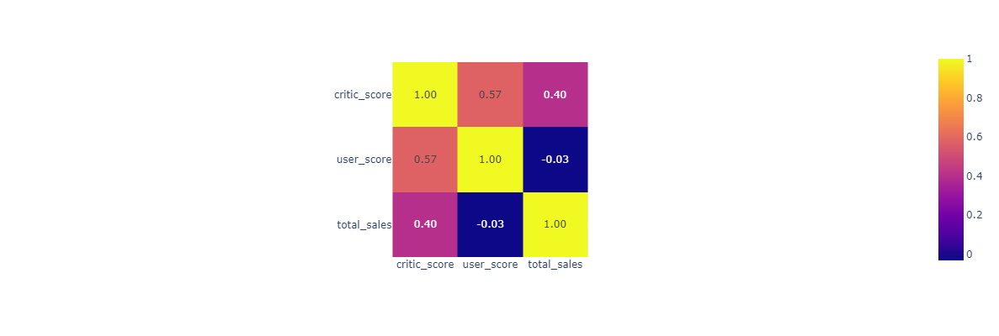

In [71]:
# построим матрицу корреляции с помощью функции corr()
corr_data = data_last_years_ps4[['critic_score', 'user_score', 'total_sales']].corr()
# выведем визуальную матрицу с помощью функции px.imshow()
corr_data
fig = px.imshow(corr_data, text_auto='.2f')
fig.update_layout(width=400, height=400)
fig.show()

На основе продаж 392 игр продававшхся на PS4 за последние 5 лет и выставленных этим играм 260 оценок можно сделать следующие выводы:
- присутствует умеренная зависимость объема продаж от оценки критиков
- отсутствует зависимость объема продаж от оценок пользователей

### **Продажи игр по жанрам**

Посмотрим на общее распределение игр по жанрам. Выделим самые прибыльные жанры за последние 5 лет

In [72]:
# выясним самую популярную платформу за последние 5 лет
data_grouped_by_sales = data_last_years.pivot_table(index=['genre'], aggfunc={'total_sales': ['sum','mean','median']})
data_grouped_by_sales.reset_index(inplace=True)
data_grouped_by_sales.columns = ['genre', 'mean_sales', 'median_sales', 'total_sales']
data_grouped_by_sales.sort_values('median_sales', ascending=False)

,genre,mean_sales,median_sales,total_sales
8,Shooter,1.296723,0.440,304.73
10,Sports,0.675634,0.240,181.07
4,Platform,0.717647,0.210,61.00
7,Role-Playing,0.521081,0.140,192.80
6,Racing,0.465217,0.140,53.50
2,Fighting,0.408165,0.130,44.49
0,Action,0.427856,0.120,441.12
3,Misc,0.442917,0.120,85.04
9,Simulation,0.439000,0.120,35.12
11,Strategy,0.187887,0.080,13.34


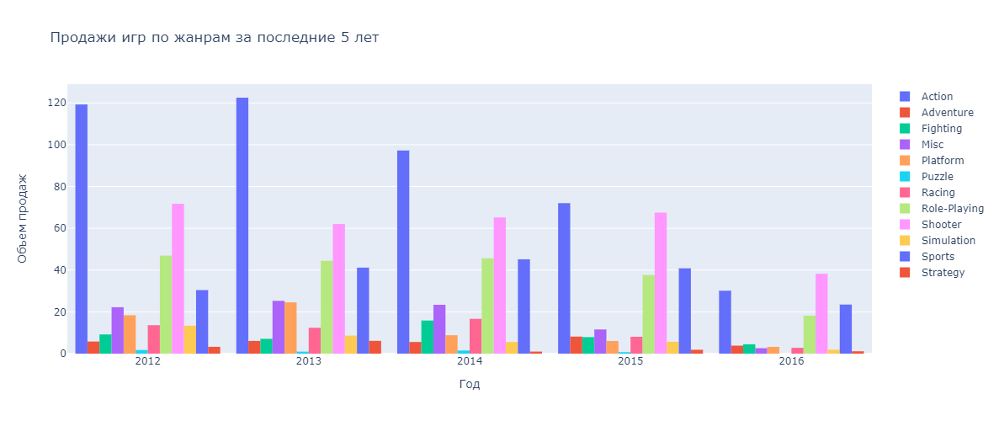

In [73]:
# выделим отдельно список жанров
genre = data_grouped_by_sales['genre']

# построим график продаж игр по жанрам по годам
fig6 = go.Figure()
for row in genre:
    fig6.add_trace(go.Histogram(dict(x=data_last_years[data_last_years['genre'] == row]["year_of_release"],
                                     y=data_last_years[data_last_years['genre'] == row]['total_sales'],
                                     histfunc='sum', name=row)))
fig6.update_layout(bargap=0.1)
# зададим название оси X
fig6.update_xaxes({'title':'Год'})
# зададим название оси Y    
fig6.update_yaxes({'title':'Объем продаж'})
fig6.update_layout({'title': 'Продажи игр по жанрам за последние 5 лет'}, height=500)
fig6.show()

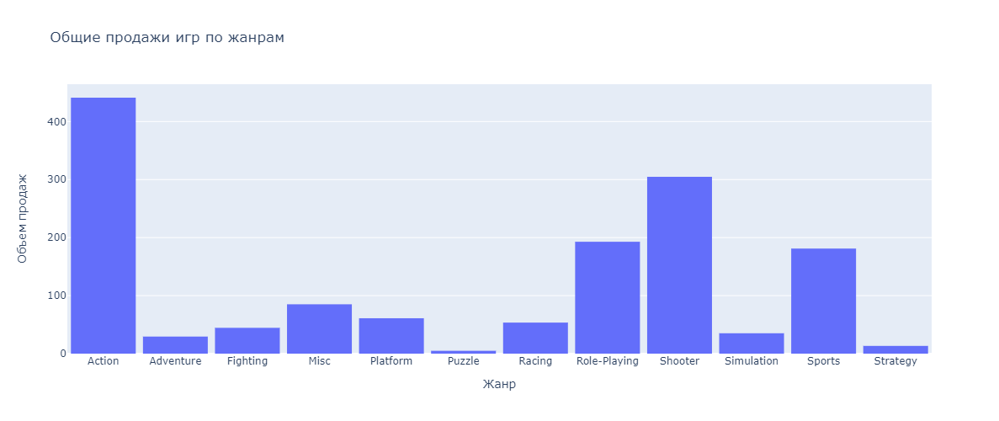

In [74]:
# построим график общих продаж игр по жанрам
fig7 = go.Figure()
fig7.add_trace(go.Histogram(x=data_grouped_by_sales['genre'],
                            y=data_grouped_by_sales['total_sales'], histfunc='sum'))
fig7.update_layout(bargap=0.1)
# зададим название оси X
fig7.update_xaxes({'title':'Жанр'})
# зададим название оси Y    
fig7.update_yaxes({'title':'Объем продаж'})
fig7.update_layout({'title': 'Общие продажи игр по жанрам'}, height=500)
fig7.show()

Добавим графики зависимостей средних и медианных значений продаж в зависимости от жанра

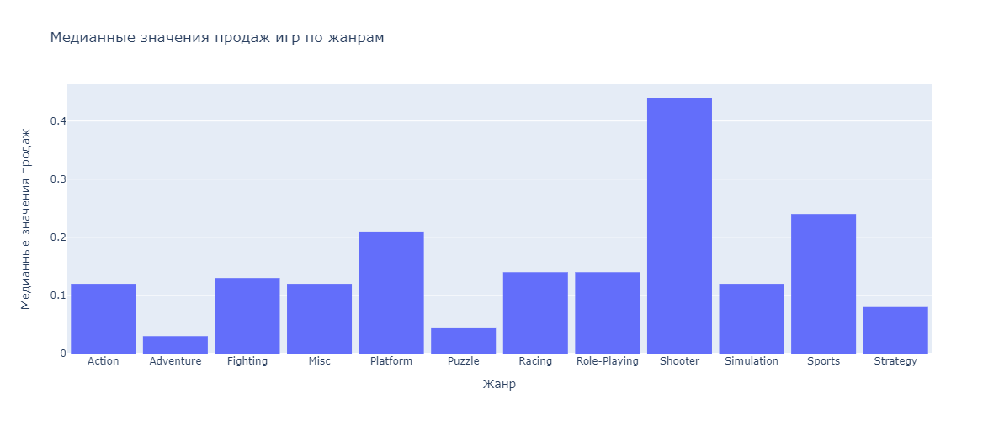

In [75]:
# построим график медианных продаж игр по жанрам
fig7 = go.Figure()
fig7.add_trace(go.Histogram(x=data_grouped_by_sales['genre'],
                            y=data_grouped_by_sales['median_sales'], histfunc='sum'))
fig7.update_layout(bargap=0.1)
# зададим название оси X
fig7.update_xaxes({'title':'Жанр'})
# зададим название оси Y    
fig7.update_yaxes({'title':'Медианные значения продаж'})
fig7.update_layout({'title': 'Медианные значения продаж игр по жанрам'}, height=500)
fig7.show()

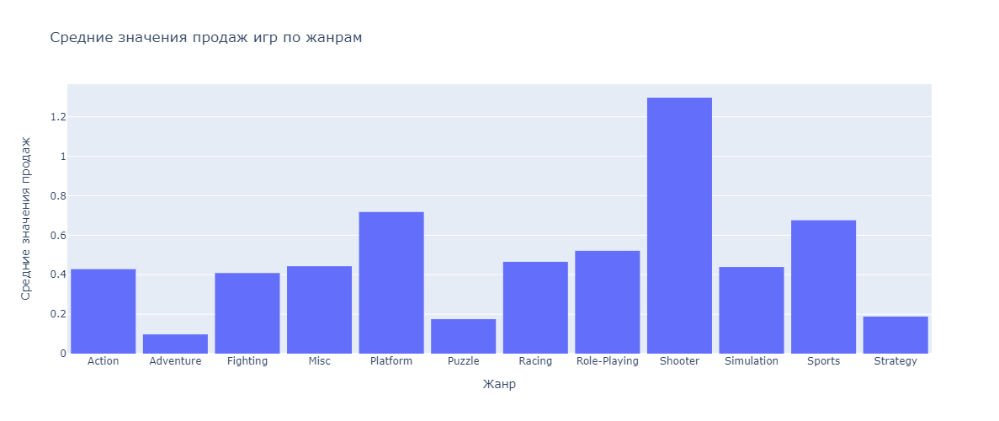

In [76]:
# построим график продаж игр по жанрам
fig7 = go.Figure()
fig7.add_trace(go.Histogram(x=data_grouped_by_sales['genre'],
                            y=data_grouped_by_sales['mean_sales'], histfunc='sum'))
fig7.update_layout(bargap=0.1)
# зададим название оси X
fig7.update_xaxes({'title':'Жанр'})
# зададим название оси Y    
fig7.update_yaxes({'title':'Средние значения продаж'})
fig7.update_layout({'title': 'Средние значения продаж игр по жанрам'}, height=500)
fig7.show()

Самым высокими значения общих продаж по жанрам в играх являются:
- Action с 441 млн. проданных копий
- Shooter c 304 млн. проданных копий
- Role-Playing c 192 млн. проданных копий

Наименее популярными являются игры следующих жанров:
- Strategy с 13 млн. проданных копий
- Puzzle с 5 млн. проданных копий

У большинства жанров есть тенденция к снижению уровня продаж. Это не сильно коснулось жанра Shooter кроме показателей 2016 года

Но при этом самыми прибыльными жанрами являются:
- Shooter со средними продажами в 1,3 млн. и медианой в 440 тыс.
- Sports со средними продажами в 676 тыс. и медианой в 240 тыс.
- Platform со средними продажами в 717 тыс. и медианой в 210 тыс.

### **Вывод**

По результатам исследовательского анализа можно сказать следующее:
- в среднем "жизнь" популярных платформ составляет от 6 до 10 лет
- малопопулярные платформы редко поддерживаются более 2 лет
- наибольший объем продаж за период с 1994 по 2016 год на следующих платформах: PS2 (1255 млн.), XBOX360 (971 млн.) и PS3 (939 млн.)
- у каждой популярной платформы наблюдается постепенный рост, а затем (через 3-5 лет) спад продаж, до выпуска следующего поколения платформы. 
- к концу 2016 года наиболее популярными платформами являются: XBOX One, Sony PS4, Sony PS3 и PC.

Если рассматривать период за последние 5 лет, то можно утверждать следующее:
- объем продаж на платформах прошлого поколения падает (Sony PS3, XBOX 360, Nintendo Wii, Nintendo 3DS)
- наблюдается постепенный рост платформ нового поколения (Sony PS4 и XBOX One)
- постепенно уменьшается рынок PC игр. За последние 5 лет объем продаж снизился в 6 раз
- старт продаж на некоторых платформах нового поколения гораздо медленее чем у консолей прошлого поколения. К примеру, на XBOX 360 за первые 2 года продано 146 млн. копий игр, а на XBOX One всего 73 млн. А старт Nintendo WiiU можно считать провальным, т.к. за 4 года после выпуска продано всего 82 млн. копий игр, тогда как на прошлом поколении только за первый год было продано 137 млн. копий игр.
- старт продаж на Sony PS4 был лучше чем на прошлом поколении платформы Sony PS3, когда за первые 2 года было продано 94 млн. копий игр, а у PS4 продажи составили 126 млн. копий за тот же период
- большинство игр на разных платформах редко достигают продаж более 600-900 тыс. проданных копий
- популярными играми можно считать игры с общими продажами от 1,5 млн. проданных копий. На каждой платформе количество таких игр составляет менее 1%.
- значительное количество хитов, обеспечивает и значительные продажи среди менее популярных игр и также является одной из основных характеристик успешности платформы. 
- медианное значение объема продаж на популярных платформах составляет 200-300 тыс. проданных копий игр. Наиболее привлекательной с это стороны из новых платформ можно рассматривать XBOX One с медианным объемом продаж в 220 тыс. На основании этого разработчики могут рассчитывать доходы от продаж и потенциально понимать стоимость одной копии своей игры.
- оценки критиков умеренно влияют на объемы продаж в отличие от оценок пользователей
- наибольшие продажи обеспечивают игры следующих жанров: Action (441 млн.), Shooter (304 млн.), Role-Playing (192 млн.), но при этом наиболее прибыльными являются жанры Shooter (средние продажи в 1,3 млн. и медиана в 440 тыс.), Sports (средние продажи в 676 тыс. и медиана в 240 тыс.), platform (средниt продажи в 717 тыс. и медиана в 210 тыс.). В первых двух указанных жанрах это может быть связано с небольшим количеством выпускаемых игр, т.к. игры жанра Shooter сложны и дороги в производстве, а популярные игры жанра Sports дороги в производстве, в том числе из-за необходимости покупки дорогостоящих лицензий брендов спортивных организаций, клубов и т.д. 
- наименее популярными являются игры жанров Strategy (13 млн.) и Puzzle (5 млн.) и наименее прибыльными являются жанры Puzzle (средние продажи в 175 тыс. и медиана в 45 тыс.) и Adventure (средние продажи в 97 тыс. и медиана в 30 тыс.)


Самыми перспективными платформами для продаж игр в 2017 году можно рассматривать в первую очередь Sony PS4. Но также стоит учитывать XBOX One, т.к. платформа все равно в персппективе будет конкурентоспособной на рынке. Небольшое внимание стоит уделить рынку PC игр, т.к. на протяжение многих лет рынок показывает относительную стабильность со всплеском продаж в период с 2008 по 2014, что может быть связано с ростом популярности MMO игр. Также в первую очередь стоит продвигать игры жанров Shooter, Sports и Platform

## **Исследование пользователей в каждом регионе**

Определим для пользователей каждого региона (NA, EU, JP):
- самые популярные платформы (топ-5). Опишем различия в долях продаж
- самые популярные жанры (топ-5). Поясним разницу
- влияет ли рейтинг ESRB на продажи в отдельном регионе

### **Исследование популярности платформ по регионам**

Рассмотрим для каждого региона объемы продаж по платформам

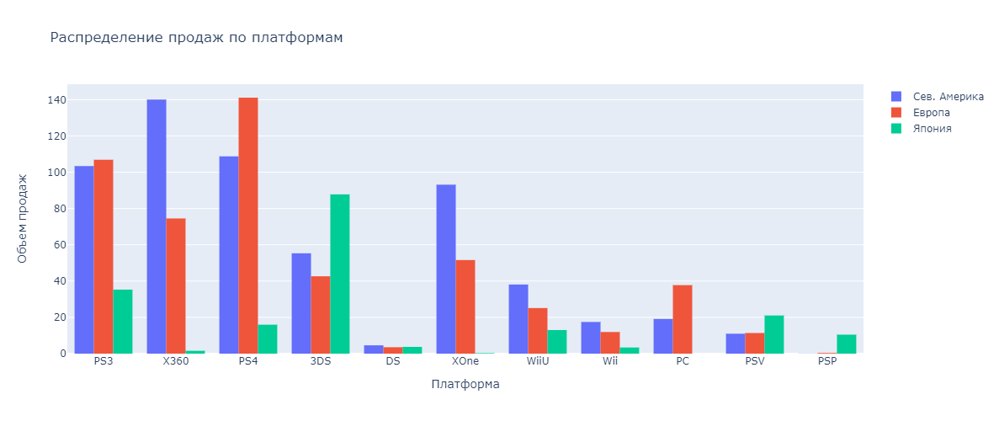

In [77]:
# построим гистограмму по каждой платформе в сравнении по регионам
fig1 = go.Figure()
# добавим гистгорамму по региону NA
fig1.add_trace(go.Histogram(histfunc="sum", x=data_last_years['platform'], y=data_last_years['na_sales'], 
                            nbinsx=100, name='Сев. Америка'))
# добавим гистгорамму по региону EU
fig1.add_trace(go.Histogram(histfunc="sum", x=data_last_years['platform'], y=data_last_years['eu_sales'], 
                            nbinsx=100, name='Европа'))
# добавим гистгорамму по региону JP
fig1.add_trace(go.Histogram(histfunc="sum", x=data_last_years['platform'], y=data_last_years['jp_sales'], 
                            nbinsx=100, name='Япония'))
# определим параметры фигуры
fig1.update_layout({'title': 'Распределение продаж по платформам'}, height=500)
# зададим название оси X
fig1.update_xaxes({'title':'Платформа'})
# зададим название оси Y    
fig1.update_yaxes({'title':'Объем продаж'})
fig1.show()

Построим круговую диаграмму и определим доли продаж для каждого региона по каждой платформе

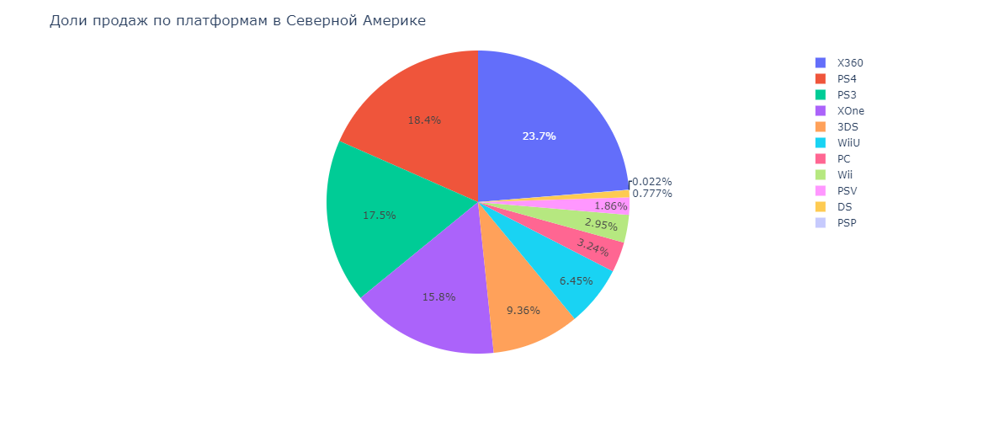

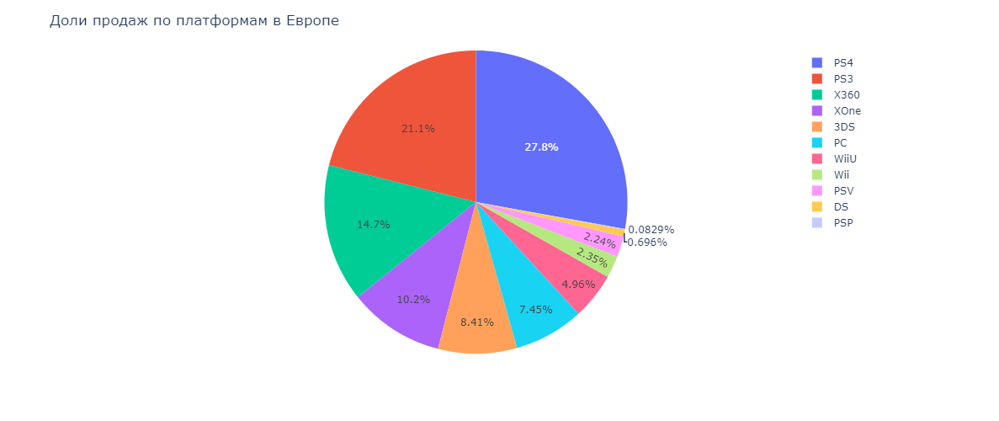

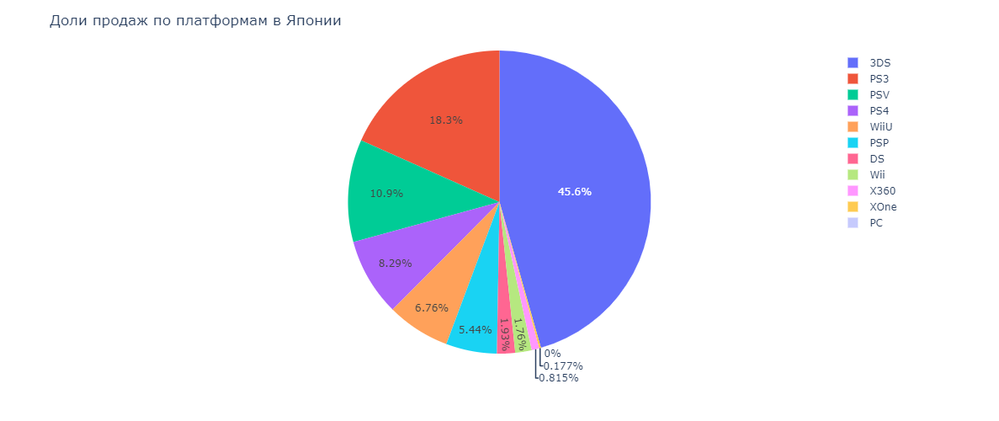

In [78]:
# построим круговую диаграмму с долями продаж по платформам по каждому региону
figr1 = px.pie(data_last_years, values='na_sales', names='platform')
figr1.update_layout({'title': 'Доли продаж по платформам в Северной Америке'}, height=500)
figr1.show()
figr1 = px.pie(data_last_years, values='eu_sales', names='platform')
figr1.update_layout({'title': 'Доли продаж по платформам в Европе'}, height=500)
figr1.show()
figr1 = px.pie(data_last_years, values='jp_sales', names='platform')
figr1.update_layout({'title': 'Доли продаж по платформам в Японии'}, height=500)
figr1.show()

In [79]:
# выведим 20 популярных игр на платформе XBOX360 в Северной Америке
data_last_years[data_last_years['platform']=='X360'].sort_values('na_sales', ascending=False).head(20)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
23,Grand Theft Auto V,X360,2013,Action,9.66,5.14,0.06,1.41,97.0,8.1,M,16.27
35,Call of Duty: Black Ops II,X360,2012,Shooter,8.25,4.24,0.07,1.12,83.0,4.8,M,13.68
60,Call of Duty: Ghosts,X360,2013,Shooter,6.73,2.56,0.04,0.91,73.0,2.6,M,10.24
66,Halo 4,X360,2012,Shooter,6.65,2.28,0.04,0.74,87.0,7.0,M,9.71
72,Minecraft,X360,2013,Misc,5.70,2.65,0.02,0.81,NaN,NaN,,9.18
176,Assassin's Creed III,X360,2012,Action,3.13,1.69,0.03,0.44,84.0,6.7,M,5.29
263,Call of Duty: Advanced Warfare,X360,2014,Shooter,2.77,1.11,0.00,0.40,49.0,4.9,M,4.28
473,NBA 2K13,X360,2012,Sports,2.60,0.20,0.01,0.19,88.0,7.2,E,3.00
507,Madden NFL 13,X360,2012,Sports,2.53,0.15,0.00,0.17,81.0,5.8,E,2.85
380,Battlefield 4,X360,2013,Shooter,2.15,1.01,0.02,0.31,79.0,5.6,M,3.49


In [80]:
# выведим 20 популярных игр на платформе PS4 в Европе
data_last_years[data_last_years['platform']=='PS4'].sort_values('eu_sales', ascending=False).head(20)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
42,Grand Theft Auto V,PS4,2014,Action,3.96,6.31,0.38,1.97,97.0,8.3,M,12.62
77,FIFA 16,PS4,2015,Sports,1.12,6.12,0.06,1.28,82.0,4.3,E,8.58
31,Call of Duty: Black Ops 3,PS4,2015,Shooter,6.03,5.86,0.36,2.38,NaN,NaN,,14.63
94,FIFA 17,PS4,2016,Sports,0.66,5.75,0.08,1.11,85.0,5.0,E,7.60
143,FIFA 15,PS4,2014,Sports,0.80,4.33,0.05,0.90,82.0,5.7,E,6.08
87,Star Wars Battlefront (2015),PS4,2015,Shooter,2.99,3.49,0.22,1.28,NaN,NaN,,7.98
92,Call of Duty: Advanced Warfare,PS4,2014,Shooter,2.81,3.48,0.14,1.23,83.0,5.7,M,7.66
105,Fallout 4,PS4,2015,Role-Playing,2.53,3.27,0.24,1.13,87.0,6.5,M,7.17
171,Uncharted 4: A Thief's End,PS4,2016,Shooter,1.85,2.50,0.19,0.85,93.0,7.9,T,5.39
298,Far Cry 4,PS4,2014,Shooter,1.13,2.18,0.10,0.63,85.0,7.7,M,4.04


In [81]:
# выведим 20 популярных игр на платформе 3DS в Японии
data_last_years[data_last_years['platform']=='3DS'].sort_values('jp_sales', ascending=False).head(20)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
73,Animal Crossing: New Leaf,3DS,2012,Simulation,2.03,2.36,4.39,0.39,88.0,8.7,E,9.17
33,Pokemon X/Pokemon Y,3DS,2013,Role-Playing,5.28,4.19,4.35,0.78,NaN,NaN,,14.60
385,Monster Hunter 4,3DS,2013,Role-Playing,0.00,0.00,3.44,0.00,NaN,NaN,,3.44
412,Yokai Watch 2 Ganso/Honke,3DS,2014,Role-Playing,0.09,0.00,3.18,0.01,NaN,NaN,,3.28
47,Pokemon Omega Ruby/Pokemon Alpha Sapphire,3DS,2014,Role-Playing,4.35,3.49,3.10,0.74,NaN,NaN,,11.68
406,Monster Hunter X,3DS,2015,Action,0.27,0.21,2.79,0.05,NaN,NaN,,3.32
563,Yokai Watch 2 Shinuchi,3DS,2014,Role-Playing,0.00,0.00,2.68,0.00,NaN,NaN,,2.68
312,Monster Hunter 4 Ultimate,3DS,2014,Role-Playing,0.68,0.48,2.62,0.11,86.0,8.7,T,3.89
62,New Super Mario Bros. 2,3DS,2012,Platform,3.66,3.14,2.47,0.63,78.0,7.2,E,9.90
96,Super Smash Bros. for Wii U and 3DS,3DS,2014,Fighting,3.27,1.37,2.43,0.48,NaN,NaN,,7.55


В каждом из рассматриваемых регионов можно отметить разные предпочтения в используемых платформах согласно полученных долей продаж.

В **Северной Америке** предпочитают игры на следующих платформах (в скобках указана доля продаж в %):
- XBOX 360 (23.7%)
- Sony PS4 (18.4%)
- Sony PS3 (17.5%)
- XBOX One (15.8%)
- Nintendo 3DS (9.4%)

Доля продаж на 5 самых популярных платформах составляет 84.8%. В Северной Америке предпочитают игры и сервисы, разработанные для платформы Microsoft. Особой популярностью пользуются игры, поддерживаемых самой Microsoft (серия Halo). Также очень популярны игры серии Call of Duty, GTA, атакже спортивные игры серий NBA и Madden NFL

В **Европе** предпочитают игры на следующих платформах (в скобках указана доля продаж в %):
- Sony PS4 (27.8%)
- Sony PS3 (21.1%)
- XBOX 360 (14.7%)
- XBOX One (10.2%)
- Nintendo 3DS (8.4%)

Доля продаж на 5 самых популярных платформах составляет 82.2%. В Европе немного иная ситуация. Большоое препочтение дается играм выпущенным в том числе на платформах Sony. Доля продаж на них составляет половину от всех продаж на европейском рынке. Особой популярностью пользуются игры серии GTA, спортивные симуляторы серии FIFA.

В **Японии** предпочитают игры на следующих платформах (в скобках указана доля продаж в %):
- Nintendo 3DS (45.6%)
- Sony PS3 (18.3%)
- Sony PSV (10.9%)
- Sony PS4 (8.3%)
- Nintendo WiiU (6.8%)

Доля продаж на 5 самых популярных платформах составляет 89.9%. В Японии кардинально другая ситуация. Предпочтение в основном дается платформам японских  производителей Nintendo и Sony. Причем продукты первого пользуются большей популярностью и каждая вторая игра продается для платформы от Nintendo. Основное препочтение дается небольшим играм для портивной консоли 3DS, в основном выпускаемых для внутреннего рынка Японии

### **Исследование популярности платформ по жанрам**

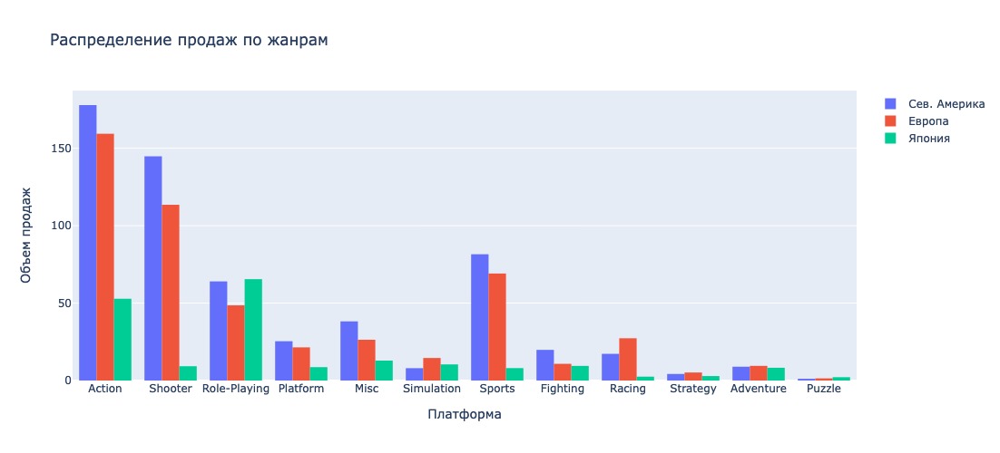

In [82]:
# построим гистограмму по каждому жанру в сравнении по регионам
fig1 = go.Figure()
# добавим гистгорамму по региону NA
fig1.add_trace(go.Histogram(histfunc="sum", x=data_last_years['genre'], y=data_last_years['na_sales'], 
                            nbinsx=100, name='Сев. Америка'))
# добавим гистгорамму по региону EU
fig1.add_trace(go.Histogram(histfunc="sum", x=data_last_years['genre'], y=data_last_years['eu_sales'], 
                            nbinsx=100, name='Европа'))
# добавим гистгорамму по региону JP
fig1.add_trace(go.Histogram(histfunc="sum", x=data_last_years['genre'], y=data_last_years['jp_sales'], 
                            nbinsx=100, name='Япония'))
# определим параметры фигуры
fig1.update_layout({'title': 'Распределение продаж по жанрам'}, height=500)
# зададим название оси X
fig1.update_xaxes({'title':'Платформа'})
# зададим название оси Y    
fig1.update_yaxes({'title':'Объем продаж'})
fig1.show()

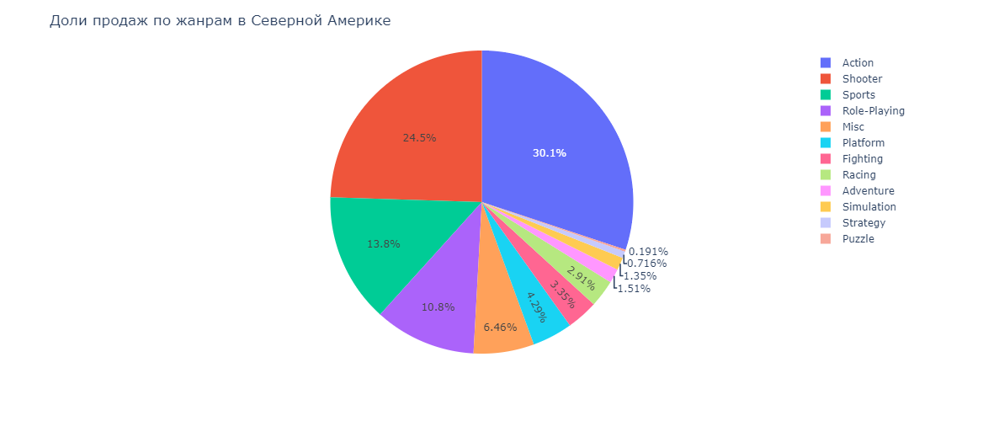

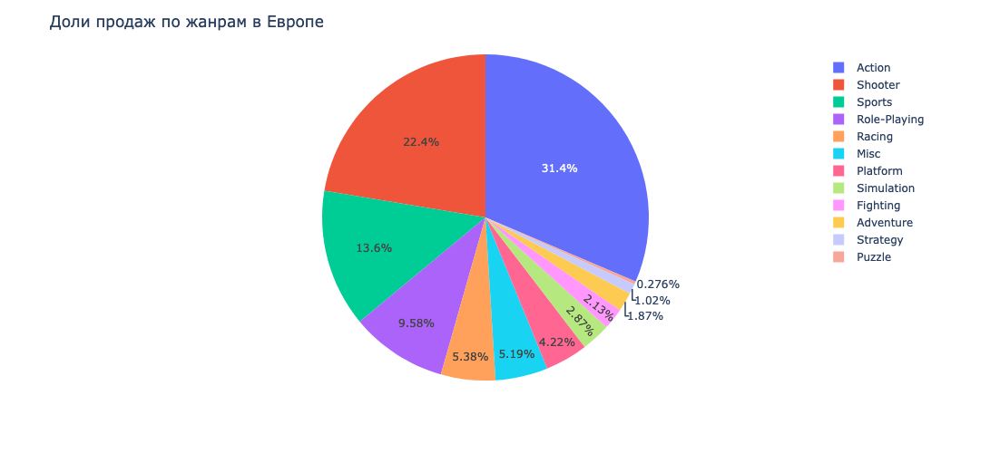

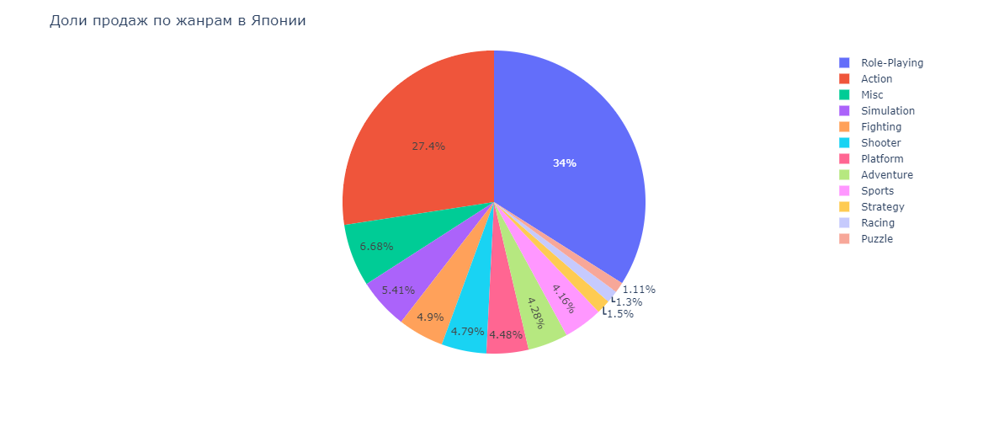

In [83]:
# построим круговую диаграмму с долями продаж по платформам по каждому региону
figr1 = px.pie(data_last_years, values='na_sales', names='genre')
figr1.update_layout({'title': 'Доли продаж по жанрам в Северной Америке'}, height=500)
figr1.show()
figr1 = px.pie(data_last_years, values='eu_sales', names='genre')
figr1.update_layout({'title': 'Доли продаж по жанрам в Европе'}, height=500)
figr1.show()
figr1 = px.pie(data_last_years, values='jp_sales', names='genre')
figr1.update_layout({'title': 'Доли продаж по жанрам в Японии'}, height=500)
figr1.show()

In [84]:
# рассмотрим продажи популярных игр в Японии
data_last_years.sort_values('jp_sales', ascending=False).head(20)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
73,Animal Crossing: New Leaf,3DS,2012,Simulation,2.03,2.36,4.39,0.39,88.0,8.7,E,9.17
33,Pokemon X/Pokemon Y,3DS,2013,Role-Playing,5.28,4.19,4.35,0.78,NaN,NaN,,14.60
385,Monster Hunter 4,3DS,2013,Role-Playing,0.00,0.00,3.44,0.00,NaN,NaN,,3.44
412,Yokai Watch 2 Ganso/Honke,3DS,2014,Role-Playing,0.09,0.00,3.18,0.01,NaN,NaN,,3.28
83,Pokemon Black 2/Pokemon White 2,DS,2012,Role-Playing,2.79,1.72,3.14,0.41,NaN,NaN,,8.06
47,Pokemon Omega Ruby/Pokemon Alpha Sapphire,3DS,2014,Role-Playing,4.35,3.49,3.10,0.74,NaN,NaN,,11.68
406,Monster Hunter X,3DS,2015,Action,0.27,0.21,2.79,0.05,NaN,NaN,,3.32
563,Yokai Watch 2 Shinuchi,3DS,2014,Role-Playing,0.00,0.00,2.68,0.00,NaN,NaN,,2.68
312,Monster Hunter 4 Ultimate,3DS,2014,Role-Playing,0.68,0.48,2.62,0.11,86.0,8.7,T,3.89
62,New Super Mario Bros. 2,3DS,2012,Platform,3.66,3.14,2.47,0.63,78.0,7.2,E,9.90


Предпочтения по жанрам в Северной Америке и Европе примерно одинаковые. Немного отличаются предпочтения у пользователей из Японии.

В **Северной Америке** предпочитают игры следующих жанров (в скобках указана доля продаж в %):
- Action (30.1%)
- Shooter (24.5%)
- Sports (13.8%)
- Role-Playing (10.8%)
- Misc (6.5%)


В **Европе** предпочитают игры следующих жанров (в скобках указана доля продаж в %):
- Action (31.4%)
- Shooter (22.4%)
- Sports (13.6%)
- Role-Playing (9.6%)
- Racing (5.4%)

Доля продаж в Северной Америке и Европе игр 5 самых популярных жанров более 80% составляет 82.2%. Наибольшей популярностью пользуются игры жанра Action и Shooter из-за популярности отделльных серий игр (GTA, Call of Duty, Halo, Uncharted). Достаточно много продаются спортивные симуляторы причем в Северной Америке предпочитают NBA или Madden NFL, а в Европе игры серии FIFA. Чуть меньшей попуялрностью пользуются ролевые игры, к которым относятся игры серии Fallout, The Elder Scrolls, Diablo и т.д.

В **Японии** предпочитают игры следующих жанров (в скобках указана доля продаж в %):
- Role-Playing (34%)
- Action (27.4%)
- Misc (6.7%)
- Simulation (5.4%)
- Fighting (4.9%)

Доля продаж на 5 самых популярных платформах составляет 78%. И опять в Японии кардинально другая ситуация. Предпочтение в основном дается ролевым играм от японских разработчиков. В Японии ведь отдельно выделен этот жанр в JRPG. Также выделяются игры жанра Action также в основном от японских разработчиков

### **Исследование влияние рейтинга ESRB на уровень продаж**

Для определения влияния рейтинга ESRB на уровень продаж создадим новый столбец `rating_number` где присвоим:
- значению `1` рейтинг `E`
- значению `2` рейтинг `E10+`
- значению `3` рейтинг `T`
- значению `4` рейтинг `M`

In [85]:
# присвоим значению 1 рейтинг E
data_last_years.loc[(data_last_years['rating']=='E'), 'rating_number'] = 1
# присвоим значению 2 рейтинг E10+
data_last_years.loc[(data_last_years['rating']=='E10+'), 'rating_number'] = 2
# присвоим значению 3 рейтинг T
data_last_years.loc[(data_last_years['rating']=='T'), 'rating_number'] = 3
# присвоим значению 4 рейтинг M
data_last_years.loc[(data_last_years['rating']=='M'), 'rating_number'] = 4
# присвоим значению 0 остальным значениям
data_last_years['rating_number'] = data_last_years['rating_number'].fillna(0)

C:\Users\User\AppData\Local\Temp\ipykernel_19528\3135897997.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_19528\3135897997.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Построим диаграмму рассеивания для выявления зависимости продаж в Северной Америке от рейтинга ESRB

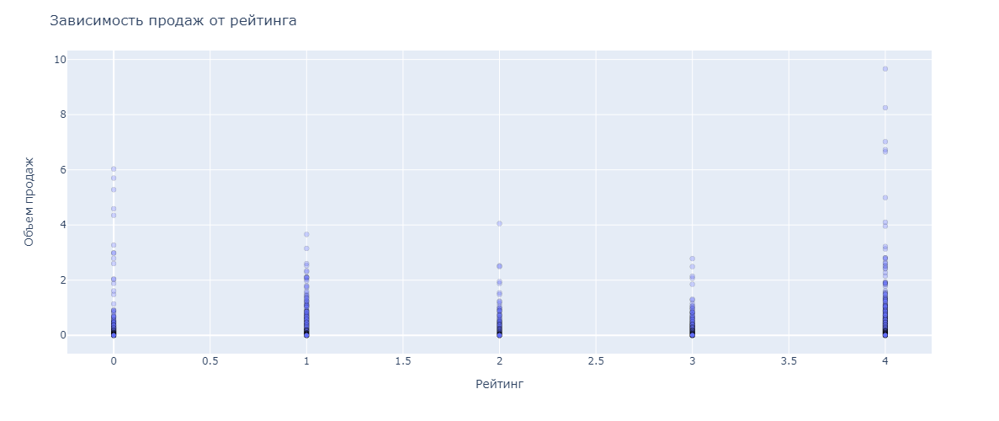

In [86]:
# Построим диаграмму рассеивания с помощью px.scatter с прозрачностью каждой точки в 0.3, высотой 500 пикселей
figsc = go.Figure()
figsc = px.scatter(data_last_years, x='rating_number', y='na_sales', opacity=0.3)
# зададим высоту графика и его название
figsc.update_layout({'title': 'Зависимость продаж от рейтинга'}, height=500)
# зададим название оси X
figsc.update_xaxes({'title':'Рейтинг'})
# зададим название оси Y    
figsc.update_yaxes({'title':'Объем продаж'})
# зададим параметры маркеров
figsc.update_traces(marker=dict(size=6, line=dict(width=0.2,color='DarkSlateGrey')), selector=dict(mode='markers'))
figsc.show()

Построим матрицу корреляции зависимости продаж в Северной Америке от рейтинга ESRB

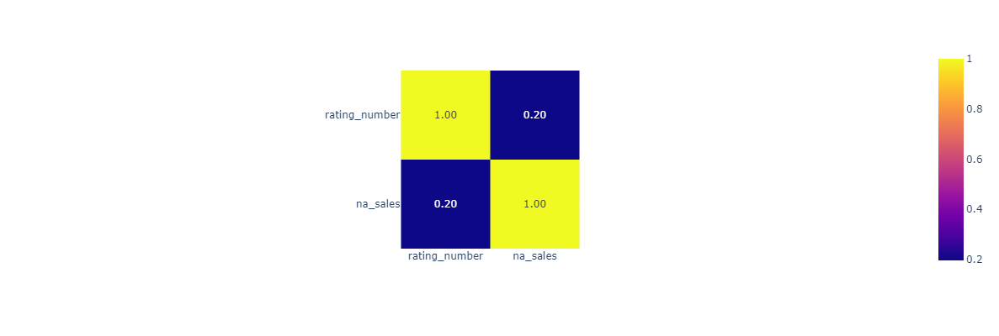

In [90]:
# построим матрицу корреляции с помощью функции corr()
corr_data = data_last_years[['rating_number', 'na_sales']].corr()
# выведем визуальную матрицу с помощью функции px.imshow()
corr_data
fig = px.imshow(corr_data, text_auto='.2f')
fig.update_layout(width=400, height=400)
fig.show()

Как видим из матрицы корреляции присутствует слабая зависимость уровня продаж от выдаваемого рейтинга ESRB в Северной Америке, то есть есть игры которые хорошо продаются с рейтингом E так и с рейтингом M, для которого более строгие ограничения по возрасту

Построим диаграмму рассеивания для выявления зависимости продаж в Европе от рейтинга ESRB

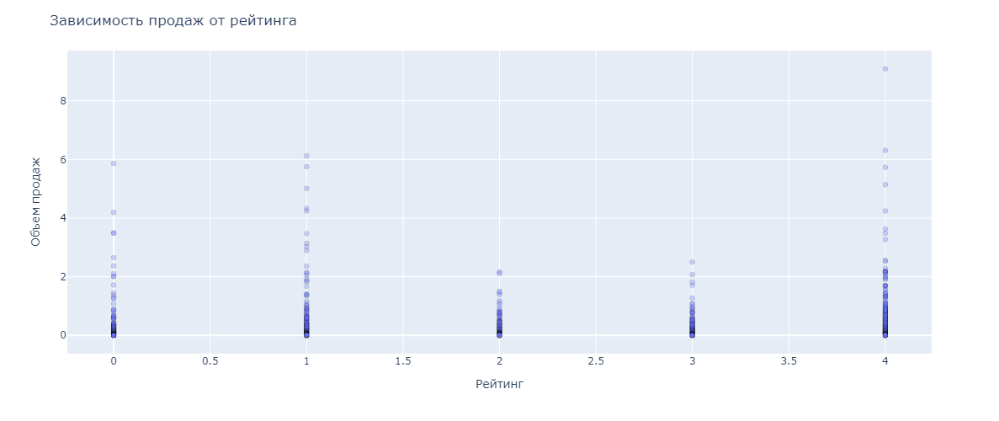

In [88]:
# Построим диаграмму рассеивания с помощью px.scatter с прозрачностью каждой точки в 0.3, высотой 500 пикселей
figsc = go.Figure()
figsc = px.scatter(data_last_years, x='rating_number', y='eu_sales', opacity=0.3)
# зададим высоту графика и его название
figsc.update_layout({'title': 'Зависимость продаж от рейтинга'}, height=500)
# зададим название оси X
figsc.update_xaxes({'title':'Рейтинг'})
# зададим название оси Y    
figsc.update_yaxes({'title':'Объем продаж'})
# зададим параметры маркеров
figsc.update_traces(marker=dict(size=6, line=dict(width=0.2,color='DarkSlateGrey')), selector=dict(mode='markers'))
figsc.show()

Построим матрицу корреляции зависимости продаж в Европе от рейтинга ESRB

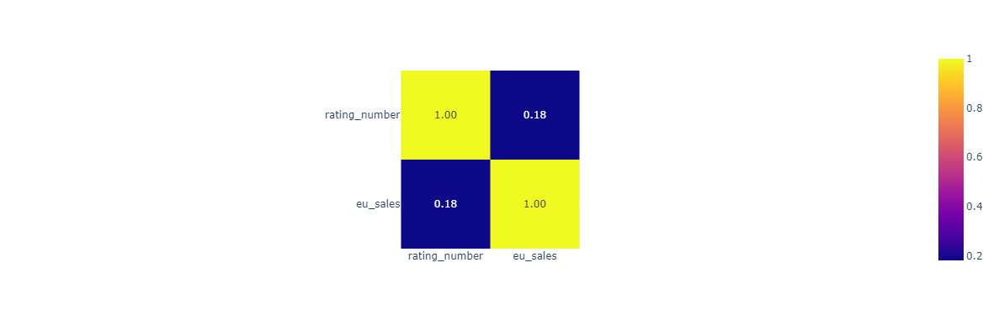

In [89]:
# построим матрицу корреляции с помощью функции corr()
corr_data = data_last_years[['rating_number', 'eu_sales']].corr()
# выведем визуальную матрицу с помощью функции px.imshow()
corr_data
fig = px.imshow(corr_data, text_auto='.2f')
fig.update_layout(width=400, height=400)
fig.show()

Как видим из матрицы корреляции ест слабая зависимость уровня продаж от выдаваемого рейтинга ESRB в Европе, то есть, как и в Северной Америке, есть игры которые хорошо продаются с рейтингом E так и с рейтингом M, для которого более строгие ограничения по возрасту

Построим диаграмму рассеивания для выявления зависимости продаж в Японии от рейтинга ESRB

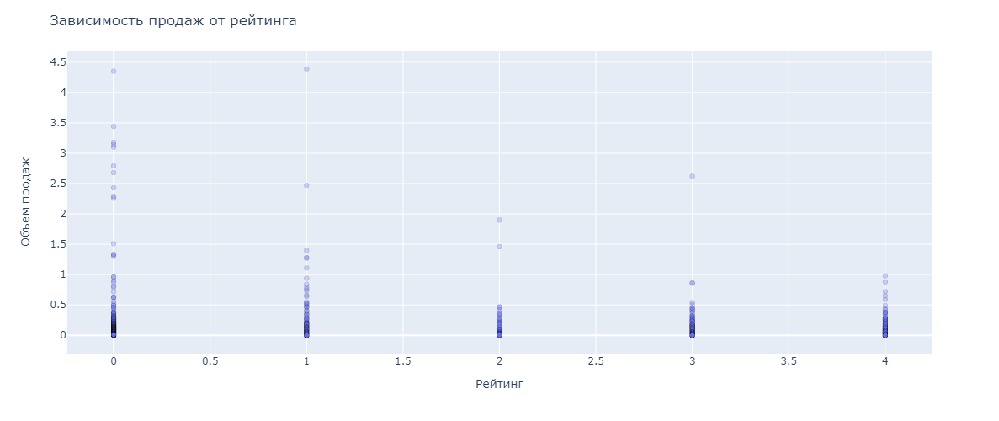

In [91]:
# Построим диаграмму рассеивания с помощью px.scatter с прозрачностью каждой точки в 0.3, высотой 500 пикселей
figsc = go.Figure()
figsc = px.scatter(data_last_years, x='rating_number', y='jp_sales', opacity=0.3)
# зададим высоту графика и его название
figsc.update_layout({'title': 'Зависимость продаж от рейтинга'}, height=500)
# зададим название оси X
figsc.update_xaxes({'title':'Рейтинг'})
# зададим название оси Y    
figsc.update_yaxes({'title':'Объем продаж'})
# зададим параметры маркеров
figsc.update_traces(marker=dict(size=6, line=dict(width=0.2,color='DarkSlateGrey')), selector=dict(mode='markers'))
figsc.show()

Построим матрицу корреляции зависимости продаж в Японии от рейтинга ESRB

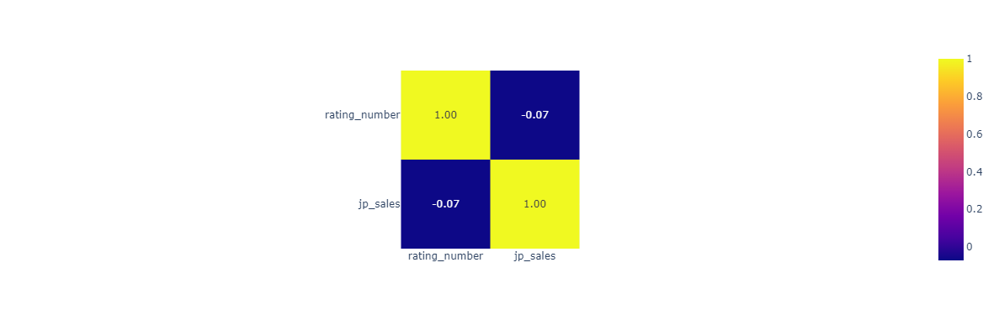

In [93]:
# построим матрицу корреляции с помощью функции corr()
corr_data = data_last_years[['rating_number', 'jp_sales']].corr()
# выведем визуальную матрицу с помощью функции px.imshow()
corr_data
fig = px.imshow(corr_data, text_auto='.2f')
fig.update_layout(width=400, height=400)
fig.show()

Как видим из матрицы корреляции, отсутствует зависимость уровня продаж от выдаваемого рейтинга ESRB в Японии

### **Вывод**

По результатам препочтений пользователей по регионам Северная Америка, Европа и Япония можно сказать следующее:
- предпочтения по игровым платформам в каждом регионе разные. Но выделяются отдельно платформы от Sony, которые входят в пятерку самых популярных в каждом регионе. Недалеко от них отстают платформы от Microsoft, но правда они не очень популярны в Японии. Платформы от Nintendo остаются нишевым проектом для казуальных игроков, но при этом очень популярны консоли от них в Японии.
- предпочтения по жанрам в Европе и Северной Америке примерно одинаковые. Особенно популярны игры жанра Action и Shooter на которые больше половины продаж. Это связано с популярностью игровых серий Call of Duty и GTA. Также популярны спортивные симуляторы, но с оговоркой, что в Европе предпочитают футбольные симуляторы, а в Северной Америке популярны баскетбольные симуляторы и симуляторы американского футбола.
- можно отметить, что возрастной рейтинг практически не влияет на уровень продаж игр независимо от региона. А влияет скорее всего другие факторы как стоимость копии игры, качетсво геймдизайна и др.

## **Проверка гипотез**

Проверим несколько гипотез. Проверку гипотез также будем проверять на данных за последние 5 лет, чтобы лучше отражать предпочтения пользователей для последующего прогноза рекламной кампании

Проверим две совокупности: оценки пользователей на платформах XBOX One и на PC. 

Для этого используем гипотезу о равенстве средних двух генеральных совокупностей. Первая совокупность - оценки пользователей игр на платформе XBOX One, вторая совокупность - оценки пользователей игр на платформе PC. Вычислим значение p-value проверки гипотез. Если p-value > alpha, то нулевая гипотеза подвердится. В ином случае подвердиться альтернативная гипотеза.

Нулевая гипотеза: в среднем игры на XBOX One и PC имеют одинаковый средний пользовательский рейтинг

Альтернативная гипотеза: в среднем игры на XBOX One и PC имеют разный средний пользовательский рейтинг

Для выбора критического уровня значимости рассмотрим объемы рассматриваемых выборок

In [94]:
# исключим строки с пропусками в столбце 'user_score'
data_last_years_tmp = data_last_years[data_last_years['user_score'].notnull()]

In [95]:
data_last_years_tmp[data_last_years_tmp['platform']=='X360']['name'].count()

235

In [96]:
data_last_years_tmp[data_last_years_tmp['platform']=='PC']['name'].count()

207

При таких выборках рекомендуется взять пороговое значение статистической значимости равному 0.05

In [97]:
# определим пороговое значение статистической значимости
alpha = .05

result = st.ttest_ind(
    data_last_years_tmp[data_last_years_tmp['platform']=='X360']['user_score'],
    data_last_years_tmp[data_last_years_tmp['platform']=='PC']['user_score'])

print('p-значение:', result.pvalue)

if result.pvalue < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу") 

p-значение: 0.1747776986338243
Не получилось отвергнуть нулевую гипотезу


Нулевая гипотеза подтверждена. Средний пользовательский рейтинг не зависит от того на какой платформе вышла игра на XBOX One или PC

Проверим две совокупности: оценки пользователей в играх жанров Action и Sports

Для этого используем гипотезу о равенстве средних двух генеральных совокупностей. Первая совокупность - оценки пользователей игр жанра Action, вторая совокупность - оценки пользователей игр жанра Sports. Вычислим значение p-value проверки гипотез. Если p-value > alpha, то нулевая гипотеза подвердится, В ином случае подвердиться альтернативная гипотеза.

Нулевая гипотеза: в среднем игры жанров Action и Sports имеют одинаковый средний пользовательский рейтинг

Альтернативная гипотеза: в среднем игры жанров Action и Sports имеют разный средний пользовательский рейтинг

Для выбора критического уровня значимости рассмотрим объемы рассматриваемых выборок

In [98]:
data_last_years_tmp[data_last_years_tmp['genre']=='Action']['name'].count()

527

In [99]:
data_last_years_tmp[data_last_years_tmp['genre']=='Sports']['name'].count()

197

Используем пороговое значение статистической значимости равному 0.05

In [100]:
# определим пороговое значение статистической значимости
alpha = .05
 
result = st.ttest_ind(
    data_last_years_tmp[data_last_years_tmp['genre']=='Action']['user_score'],
    data_last_years_tmp[data_last_years_tmp['genre']=='Sports']['user_score'])

print('p-значение:', result.pvalue)

if result.pvalue < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу") 

p-значение: 1.4174744799709246e-26
Отвергаем нулевую гипотезу


Нулевая гипотеза не подтверждена. Что говорит о том, что средний пользовательский рейтинг зависит от того к какому жанру относится игра. К жанру Action или Sports

## **Общий вывод**

В процессе исследования данных продаж игр в период с 1980 по 2016 год было выполнено следующее:
1. Произведено изучение датасета, выполнена предобработка данных, в процессе которой скорректированы типы данных некоторых столбцов, обработаны пропуска в столбцах `year_of_release`, `critic_score`, `user_score`, `rating`. В процессе предобработки данных не выявлено аномальных значений и дубликатов
2. Для проведения анализа данных добавлен столбец `total_sales`, содержащий значения общих продаж по всем регионам по каждой игре.
3. Проведен исследовательский анализ данных, в рамках которого:
- рассмотрено количество выпускаемых игр и продажи по годам
- рассмотрены продажи игр по различным платформам
- проверено влияют ли на продажи внутри одной популярной платформы отзывы пользователей и критиков
- рассмотрены продажи игр в зависимости от жанра

В процессе исследовательского анализа применяли гистограммы, диаграммы размаха, диаграммы рассеивания и матрицы корреляции

4. Проведено исследование пользователей в регионах Северная Америка, Европа и Япония.  Выявлены самые популярные платформы, рассмотрены различия в долях продаж каждой платформы. Также выявили самые популярные и прибыльные жанры. Проверили влияет ли рейтинг ESRB на продажи в отдельном регионе. Исследование провобили  с использованием гистограмм, круговых диаграмм, диаграмм рассеивания
5. Сформировали и проверили гипотезы о равенстве средних пользовательские рейтингов платформ Xbox One и PC и средних пользовательские рейтинги игр жанров Action и Sports. Для этого использовали гипотезу о равенстве средних двух генеральных совокупностей с вычислением p-value.


По итогам проведенного исследования мы можем сделать следующие выводы для проработки рекламной кампании в 2017 году:
- у каждой популярной платформы есть свой цикл "жизни" длительностью 6-10 лет. Лучше всего развивать рекламные направления относительно текущего поколения платформ. Самыми перспективными платформами для продаж игр в 2017 году на Европейском и Североамериканском рынках можно рассматривать в первую очередь Sony PS4. Но также стоит учитывать XBOX One т.к. платформа все равно в персппективе будет конкурентоспособной на рынке. В Японии стоит уделить отдельное внимание портативным консолям от Nintendo и Sony.
- для платформ предыдущего поколения таких как XBOX 360 и PS3 можно рассмотреть рекламные кампании относительного продвижения новых игр. К примеры если выходит новая игра из серии Call of Duty, то к ним в подарок можно прикладывать прошлые игры серии за небольшую доплату. 
- небольшое внимание в 2017 году стоит уделить рынку PC игр. Хотя он относительно небольшой, но всегда был достаточно стабильным со своим кругом клиентов в первую очередь в жанрах RPG
- в первую очередь стоит продвигать игры жанров Action, Shooter, Sports и Role-Playing, на которые приходится до 2/3 от всего объема продаж. В первую очередь это касается популярных серий Call of Duty, GTA, Uncharted, Halo, FIFA, NBA и т.д. Но для того чтобы покупали эти игры через наш магазин стоит задуматься над определнными бонусами для наших покупателей. Для рынка Японии стоит отдельно выделить игры жанра JRPG и в первую очередь бонусные программы транслировать на игры с внутреннего рынка Японии. 
- стоит учитывать особенности рынков Северной Америки и Европы, т.к. там и там охотно покупают спортивные игры, но в Северной Америке популярны NBA и Madden NFL, а в Европе игры серии FIFA, в остальных жанрах таких различий в предпочтениях нет.
- также стоит учитывать, что можно не учитывать при разработке рекламных кампаний рейтинг ESRB. Одинаково хорошо продаются игр с разными возрастными рейтингами. Далее стоит обратить внимание, что рейтинги игр на разных платформах в среднем одинаковые.